# Imports, Data Management, & Functions

In [11]:
#imports
import numpy as np
import scipy as sp
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from sklearn.decomposition import PCA

import neuscitk as ntk

In [12]:
#get dataset
dataset = ntk.LabChartDataset('/Users/prestonsands/Desktop/NEUSCI 302/Lab1/BWPSPA_Lab1MAT.mat')

In [13]:
#organize blocks into pages
page_map = {
    'spontaneousTrials' : list(range(0,10)),
    'spine3trials' : list(range(10,15)),
    'spine4trials' : list(range(15,20)),
    'spine2trials' : list(range(20,25)),
    'spine1trials' : list(range(25,30)),
    'freqTrials' : list(range(30,35))
}

dataset.organize_by_pages(page_map)

#define new datasets
spontaneousTrials = dataset.get_page('spontaneousTrials')
spine1trials= dataset.get_page('spine1trials')
spine2trials= dataset.get_page('spine2trials')
spine3trials= dataset.get_page('spine3trials')
spine4trials= dataset.get_page('spine4trials')
freqTrials= dataset.get_page('freqTrials')

#concatonated groups
spontaneousConcat = dataset.concat_blocks(range(0,10))
spine3concat = dataset.concat_blocks(range(10,15))
spine4concat = dataset.concat_blocks(range(15,20))
spine2concat = dataset.concat_blocks(range(20,25))
spine1concat = dataset.concat_blocks(range(25,30))
freqConcat = dataset.concat_blocks(range(30,35))

In [14]:
#clean data
start_index = 3061588 - 100
end_index = 3061588 + 100

spine1concat[0][start_index:end_index] = 0

In [15]:
#colors
colors = {
    'red': '#FF4F4F',
    'red1': '#FFBBBB',
    'red2': '#FF9B9B',
    'red3': '#FF8383',
    'red4': '#FF6969',
    'red5': '#FF4F4F',
    'red6': '#C73737',
    'red7': '#871C1C',
    'red8': '#4B0202',
    
    'gold': '#FFAE21',
    'gold1': '#FDE8C1',
    'gold2': '#FEDF94',
    'gold3': '#FED96C',
    'gold4': '#FFC044',
    'gold5': '#FFAE21',
    'gold6': '#D27D18',
    'gold7': '#A15B0E',
    'gold8': '#693703',

    'aqua': '#01CFCC',
    'aqua1': '#BFF8D0',
    'aqua2': '#96EFCF',
    'aqua3': '#6DE6CE',
    'aqua4': '#3ADBD8',
    'aqua5': '#01B0CF',
    'aqua6': '#0299AD',
    'aqua7': '#04768C',
    'aqua8': '#07435C',

    'blue': '#6480FF',
    'blue1': '#D0F2FF',
    'blue2': '#B2DBFF',
    'blue3': '#96BCFF',
    'blue4': '#7EA4FF',
    'blue5': '#647DFF',
    'blue6': '#535AD1',
    'blue7': '#3A29B8',
    'blue8': '#3F0F8D',

    'green1': '#94DD8B',
    'green2': '#0BB68C',
    'green3': '#038174',
}

In [16]:
#define cluster comparer
def compare_clusters(group_1, group_2, group_1_name='Group 1', group_2_name='Group 2') -> tuple[np.ndarray, np.ndarray]:

    pca = PCA().fit(group_1._waveforms)
    group_1_transformed = pca.transform(group_1._waveforms)
    group_2_transformed = pca.transform(group_2._waveforms)

    group_1_labels = group_1.labels
    group_2_labels = group_2.labels

    fig, ax = plt.subplots(figsize=(10, 8))
    counter = 0

    # Plot for group 1
    for idx, cluster in enumerate(np.unique(group_1_labels)):
        mask = group_1_labels == cluster
        ax.scatter(
            group_1_transformed[mask, 0],
            group_1_transformed[mask, 1],
            c=f'C{counter}',
            edgecolors='black',
            linewidths=0.5,
            label=f'{group_1_name} cluster {cluster}'
        )
        counter += 1

    # Plot for group 2
    for idx, cluster in enumerate(np.unique(group_2_labels)):
        mask = group_2_labels == cluster
        ax.scatter(
            group_2_transformed[mask, 0],
            group_2_transformed[mask, 1],
            #c=f'C{counter}',
            c='black',
            alpha =0.1,
            edgecolors='black',
            linewidths=0.5,
            marker='X',
            label=f'{group_2_name} cluster {cluster}'
        )
        counter += 1

    ax.set_xlabel(f'{group_1_name} PC1')
    ax.set_ylabel(f'{group_2_name} PC2')

    # Place the legend outside the plot to the right
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
    
    plt.tight_layout()
    plt.show()

    return group_1_transformed, group_2_transformed

In [17]:
#split array by stimulus
def splitByStim(data, sample_rate=40000, start_sec=2, duration_sec=2, interval_samples=1360000, num_arrays=8):
    arrays = []
    duration_samples = sample_rate * duration_sec

    for i in range(num_arrays):
        offset_sec = start_sec + i * 2
        offset_samples = offset_sec * sample_rate

        array_i = []  
        for start_idx in range(offset_samples, data.shape[1], interval_samples):
            end_idx = start_idx + duration_samples

            if end_idx <= data.shape[1]:
                array_i.append(data[:, start_idx:end_idx])
            else:
                print(f"  Skipped chunk: end_idx ({end_idx}) exceeds data length ({data.shape[1]})")

        if array_i:
            arrays.append(np.concatenate(array_i, axis=1))
        else:
            print(f"No data found for array {i}, skipping concatenation.")

    return arrays

# Figure 1D

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1760345993.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


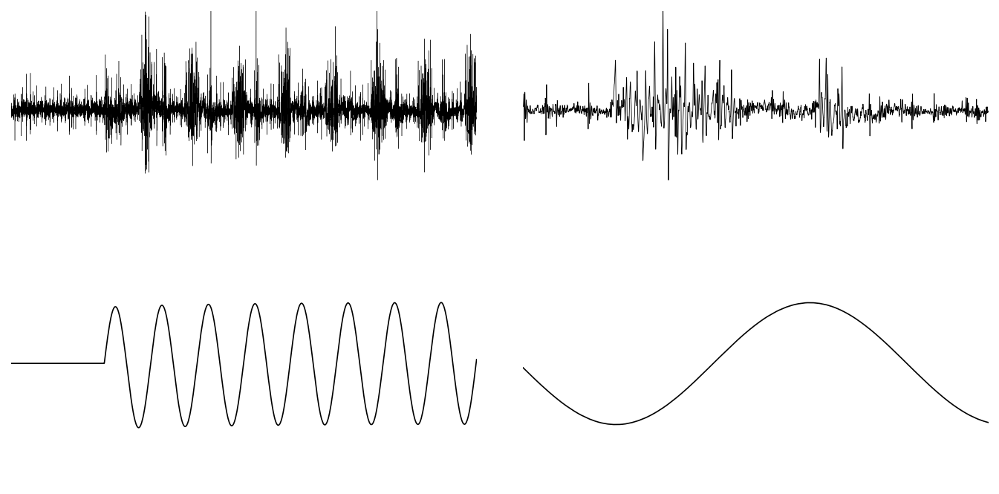

In [18]:
#figure 1D
fig = plt.figure(figsize=(11.32, 5.5), dpi=150)
gs1d = gridspec.GridSpec(2, 2, hspace=-0.02, wspace=0.1)

time1 = 1032000
time2 = 1072000

time3 = 1062000
time4 = 1066800

#plot1
ax1 = fig.add_subplot(gs1d[0, 0])
plt.plot(spine2trials['block_22'][0,time1:time2],
        color = 'black',
        linewidth = 0.2
        )
ax1.set_xticks([0, 4000, 40000])
ax1.set_yticks([-0.035, 0, 0.01, 0.025])

ax1.set_xbound([0, 40000])
ax1.set_ybound([-0.035, 0.025])

#plot2
ax2 = fig.add_subplot(gs1d[0, 1])
plt.plot(spine2trials['block_22'][0,time3:time4],
        color = 'black',
        linewidth = 0.4
        )
ax2.set_xticks([0, 400, 4800])
ax2.set_yticks([-0.035, 0, 0.01, 0.025])

ax2.set_xbound([0, 4800])
ax2.set_ybound([-0.035, 0.025])

#plot3
ax3 = fig.add_subplot(gs1d[1, 0])
plt.plot(spine2trials['block_22'][1,time1:time2],
        color = 'black',
        linewidth = 0.8
        )
ax3.set_xticks([0, 4000, 40000])
ax3.set_yticks([-0.2, 0, 0.1, 0.2])

ax3.set_xbound([0, 40000])
ax3.set_ybound([-0.4, 0.4])

#plot4
ax4 = fig.add_subplot(gs1d[1, 1])
plt.plot(spine2trials['block_22'][1,time3:time4],
        color = 'black',
        linewidth = 0.8
        )
ax4.set_xticks([0, 400, 4800])
ax4.set_yticks([-0.2, 0, 0.1, 0.2])

ax4.set_xbound([0, 4800])
ax4.set_ybound([-0.4, 0.4])

#clean
ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')

plt.tight_layout()
plt.show()



# Spike Sorting By Spine

In [19]:
thmp = 3

## Spontaneous Sorting

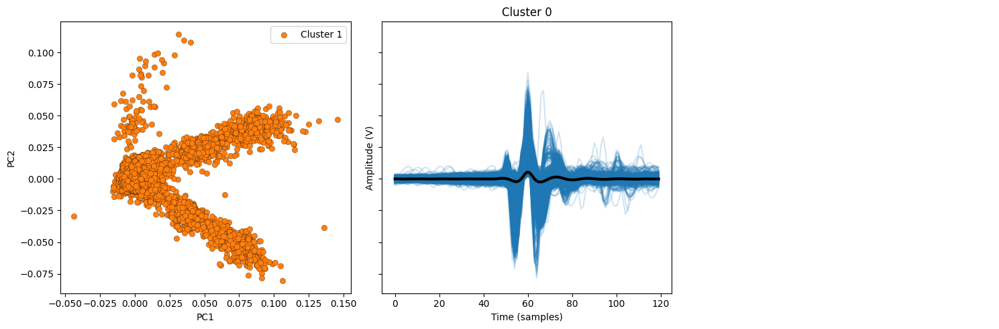

In [20]:
#spontaneous spike sorting
sortedSpontaneous = ntk.sort_spikes(spontaneousConcat[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window = 40 * 3, cluster_dimensions=10)
sortedSpontaneous.hand_pick_clusters()

sortedSpontaneous.plot_clusters()

## Spine 1 Sorting

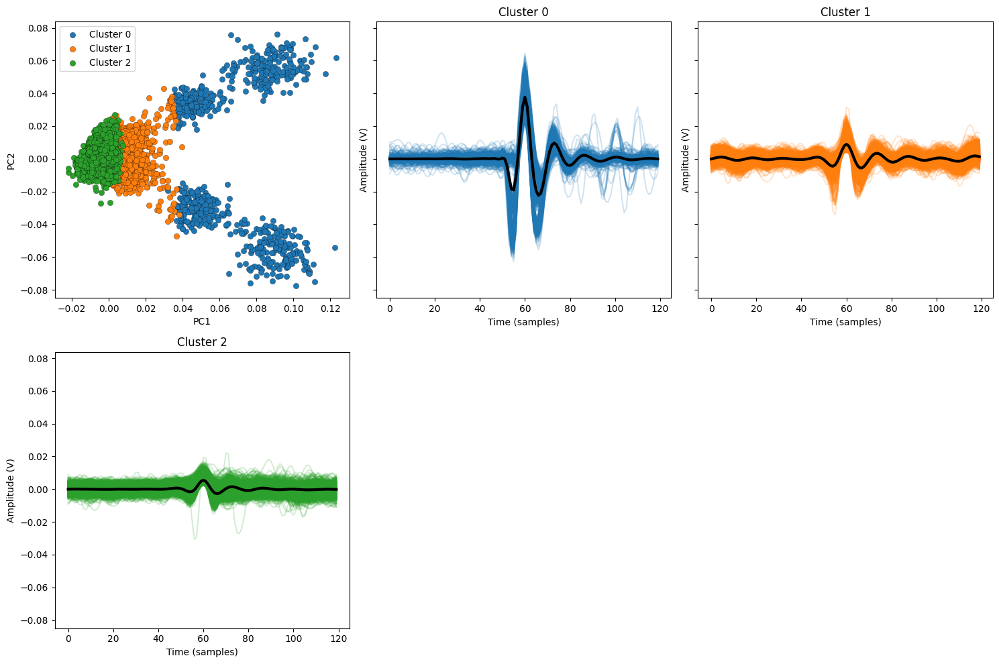

In [21]:
#spine 1 sorting
sortedSpine1 = ntk.sort_spikes(spine1concat[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window = 40 * 3, cluster_dimensions=10)
#sortedSpine1.hand_pick_clusters()

sortedSpine1.plot_clusters()

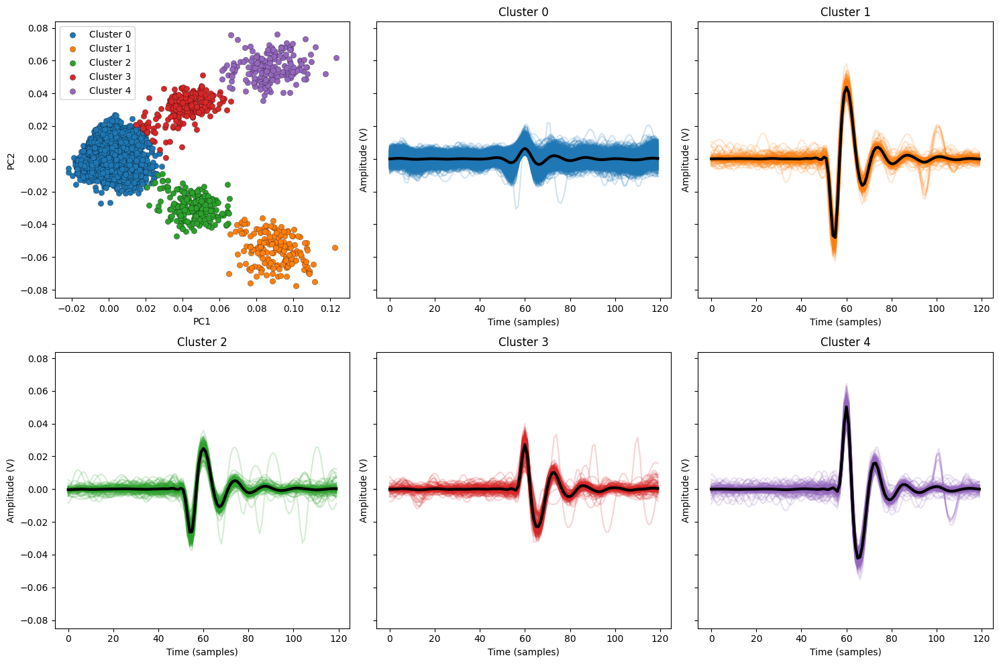

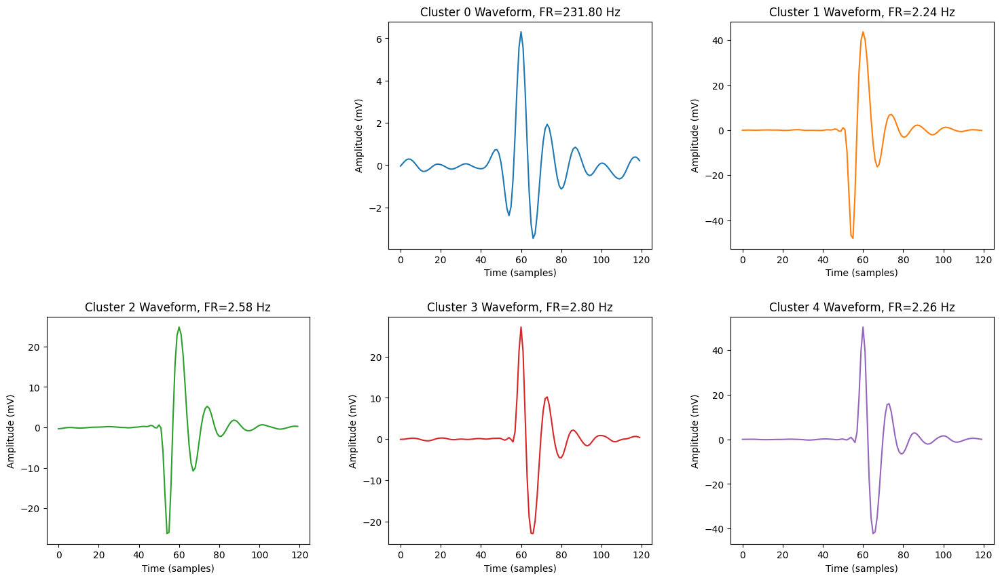

In [22]:
#recluster to view waveforms
num_clusters = 5
sortedSpine1.recluster(num_clusters)
sortedSpine1.plot_clusters()

n_cols = 3  # Number of columns in the grid
n_rows = (num_clusters + 1 + n_cols - 1) // n_cols

# Create the figure and gridspec layout
fig = plt.figure(figsize=(18, n_rows * 5))
gs = gridspec.GridSpec(n_rows, n_cols, wspace=0.3, hspace=0.3)

# Add an empty subplot at the first grid position (top-left)
ax_blank = fig.add_subplot(gs[0])
ax_blank.axis('off')  # Turn off the axis to make it blank

# Loop through the clusters and plot in the grid (starting from the second grid slot)
for i in range(num_clusters):
    temp = sortedSpine1.get_cluster_waveforms(i)
    
    # Average across the first axis (axis=0)
    temp_avg = np.mean(temp, axis=0)
    
    # Convert averaged waveform from V to mV by multiplying by 1000
    temp_mV = temp_avg * 1000
    n = temp.shape[0]
    EstimatedFR = n / 80
    
    # Create subplot at the appropriate position in the grid, starting from the second grid position
    ax = fig.add_subplot(gs[i + 1])  # Start from index 1 (second position)
    
    # Plot the averaged waveform using the default palette colors (C0, C1, etc.)
    ax.plot(temp_mV, color=f'C{i}')
    
    # Set title and labels
    ax.set_title(f'Cluster {i} Waveform, FR={EstimatedFR:.2f} Hz')
    ax.set_ylabel('Amplitude (mV)')  # Label the y-axis in mV
    ax.set_xlabel('Time (samples)')  # Adjust as needed for your x-axis

# Show the full grid of plots
plt.show()

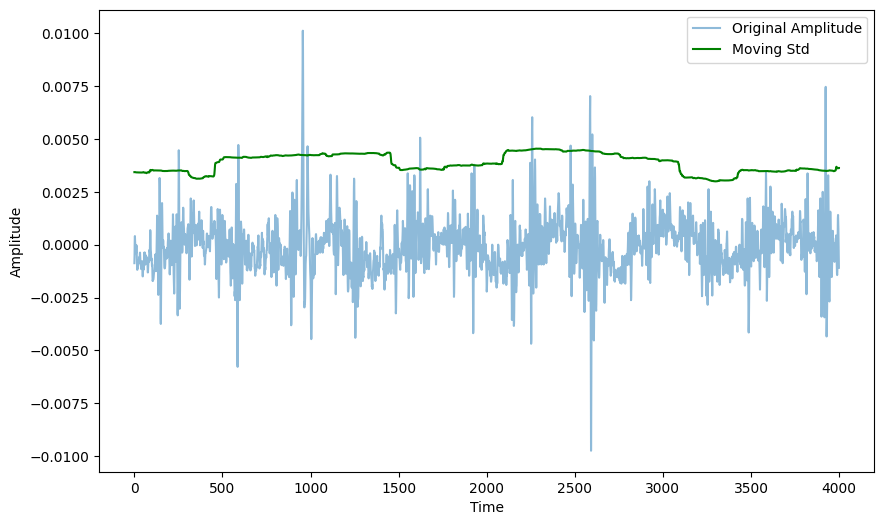

In [23]:
#plot moving std
Spine1std = ntk.moving_std(spine1concat[0], dataset.fs, 0.025)
Spine1std = Spine1std * thmp

plt.figure(figsize=(10, 6))

plt.plot(spine1concat[0, 11000:15000], label='Original Amplitude', alpha=0.5)
plt.plot(Spine1std[11000:15000], c='green', label='Moving Std')

# Add labels, legend, and title
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

# Show the plot
plt.show()

## Spine 2 Sorting

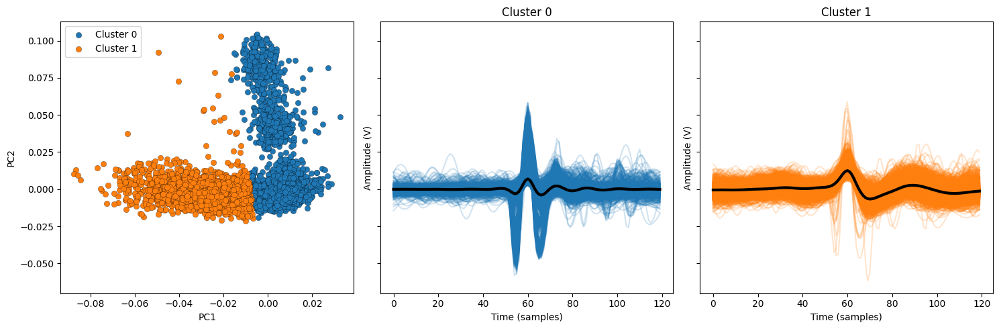

In [24]:
#spine 2 sorting
sortedSpine2 = ntk.sort_spikes(spine2concat[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window = 40 * 3, cluster_dimensions=10)
#sortedSpine2.hand_pick_clusters()

sortedSpine2.plot_clusters()

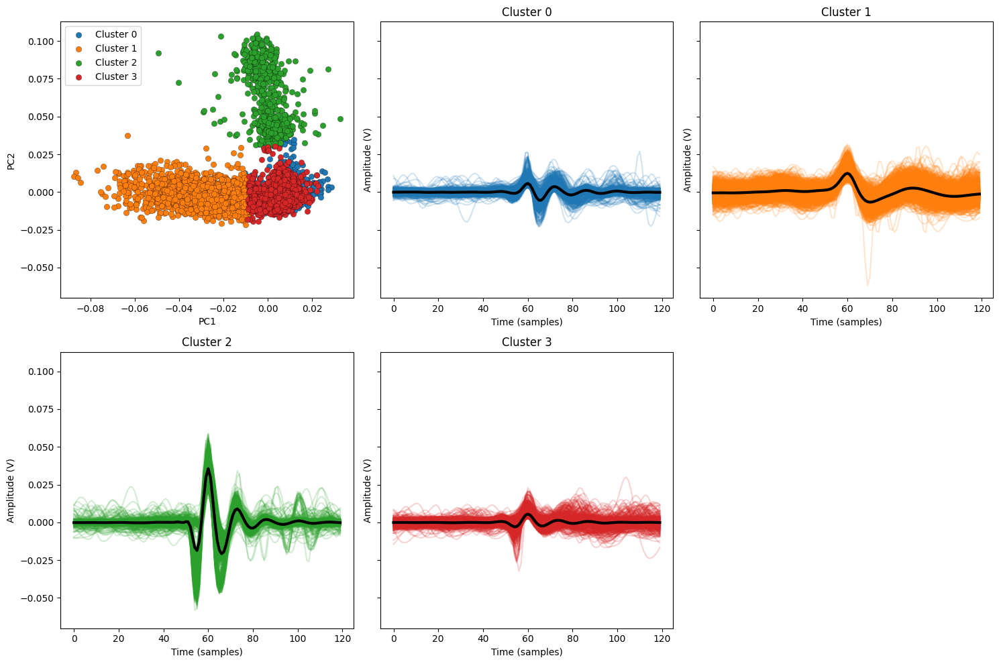

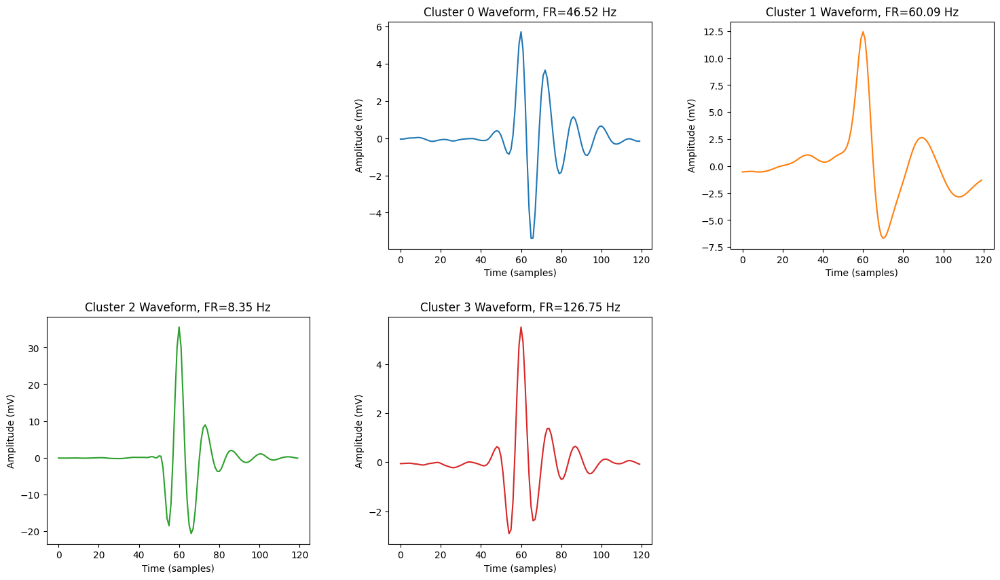

In [25]:
#recluster to view waveforms
num_clusters = 4
sortedSpine2.recluster(num_clusters)
sortedSpine2.plot_clusters()

n_cols = 3  # Number of columns in the grid
n_rows = (num_clusters + 1 + n_cols - 1) // n_cols

# Create the figure and gridspec layout
fig = plt.figure(figsize=(18, n_rows * 5))
gs = gridspec.GridSpec(n_rows, n_cols, wspace=0.3, hspace=0.3)

# Add an empty subplot at the first grid position (top-left)
ax_blank = fig.add_subplot(gs[0])
ax_blank.axis('off')  # Turn off the axis to make it blank

# Loop through the clusters and plot in the grid (starting from the second grid slot)
for i in range(num_clusters):
    temp = sortedSpine2.get_cluster_waveforms(i)
    
    # Average across the first axis (axis=0)
    temp_avg = np.mean(temp, axis=0)
    
    # Convert averaged waveform from V to mV by multiplying by 1000
    temp_mV = temp_avg * 1000
    n = temp.shape[0]
    EstimatedFR = n / 80
    
    # Create subplot at the appropriate position in the grid, starting from the second grid position
    ax = fig.add_subplot(gs[i + 1])  # Start from index 1 (second position)
    
    # Plot the averaged waveform using the default palette colors (C0, C1, etc.)
    ax.plot(temp_mV, color=f'C{i}')
    
    # Set title and labels
    ax.set_title(f'Cluster {i} Waveform, FR={EstimatedFR:.2f} Hz')
    ax.set_ylabel('Amplitude (mV)')  # Label the y-axis in mV
    ax.set_xlabel('Time (samples)')  # Adjust as needed for your x-axis

# Show the full grid of plots
plt.show()

## Spine 3 Sorting

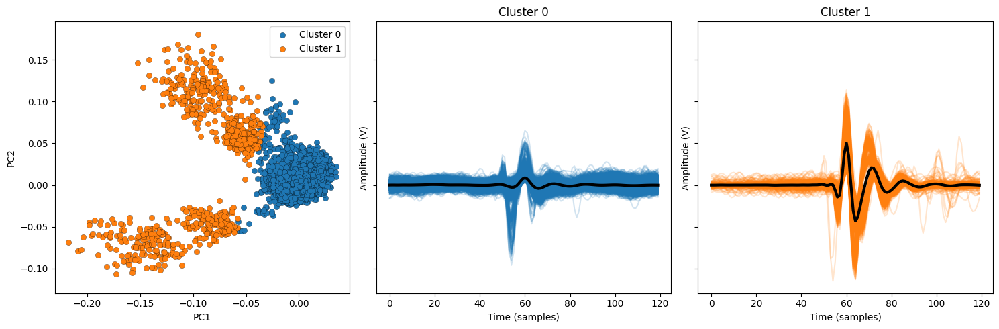

In [26]:
#spine 3 sorting
sortedSpine3 = ntk.sort_spikes(spine3concat[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window = 40 * 3, cluster_dimensions=10)
#sortedSpine3.hand_pick_clusters()

sortedSpine3.plot_clusters()

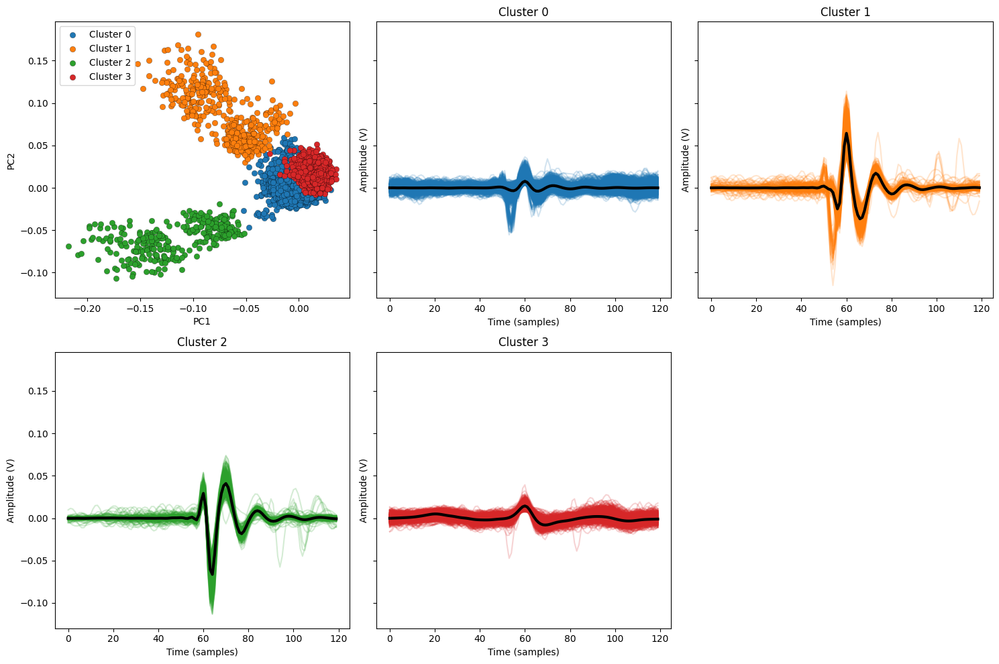

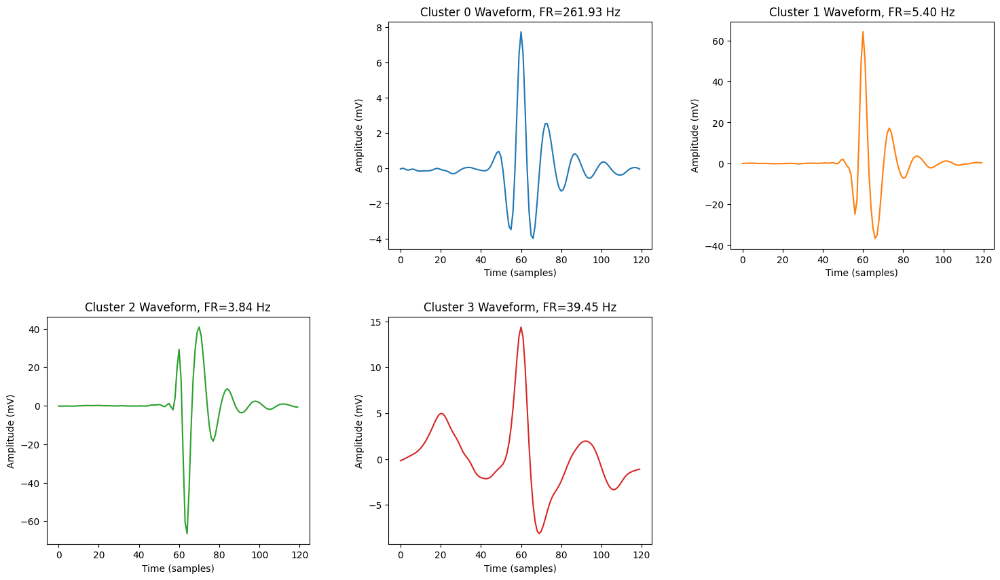

In [27]:
#recluster to view waveforms
num_clusters = 4
sortedSpine3.recluster(num_clusters)
sortedSpine3.plot_clusters()

n_cols = 3  # Number of columns in the grid
n_rows = (num_clusters + 1 + n_cols - 1) // n_cols

# Create the figure and gridspec layout
fig = plt.figure(figsize=(18, n_rows * 5))
gs = gridspec.GridSpec(n_rows, n_cols, wspace=0.3, hspace=0.3)

# Add an empty subplot at the first grid position (top-left)
ax_blank = fig.add_subplot(gs[0])
ax_blank.axis('off')  # Turn off the axis to make it blank

# Loop through the clusters and plot in the grid (starting from the second grid slot)
for i in range(num_clusters):
    temp = sortedSpine3.get_cluster_waveforms(i)
    
    # Average across the first axis (axis=0)
    temp_avg = np.mean(temp, axis=0)
    
    # Convert averaged waveform from V to mV by multiplying by 1000
    temp_mV = temp_avg * 1000
    n = temp.shape[0]
    EstimatedFR = n / 80
    
    # Create subplot at the appropriate position in the grid, starting from the second grid position
    ax = fig.add_subplot(gs[i + 1])  # Start from index 1 (second position)
    
    # Plot the averaged waveform using the default palette colors (C0, C1, etc.)
    ax.plot(temp_mV, color=f'C{i}')
    
    # Set title and labels
    ax.set_title(f'Cluster {i} Waveform, FR={EstimatedFR:.2f} Hz')
    ax.set_ylabel('Amplitude (mV)')  # Label the y-axis in mV
    ax.set_xlabel('Time (samples)')  # Adjust as needed for your x-axis

# Show the full grid of plots
plt.show()

## Spine 4 Sorting

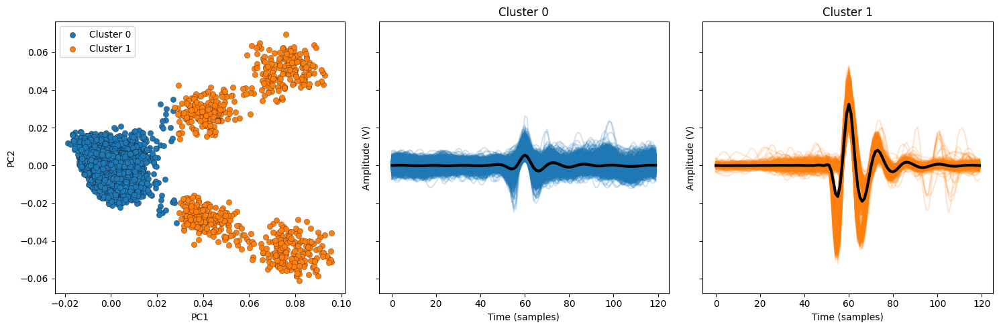

In [28]:
#spine 4 sorting
sortedSpine4 = ntk.sort_spikes(spine4concat[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window = 40 * 3, cluster_dimensions=10)
#sortedSpine4.hand_pick_clusters()

sortedSpine4.plot_clusters()

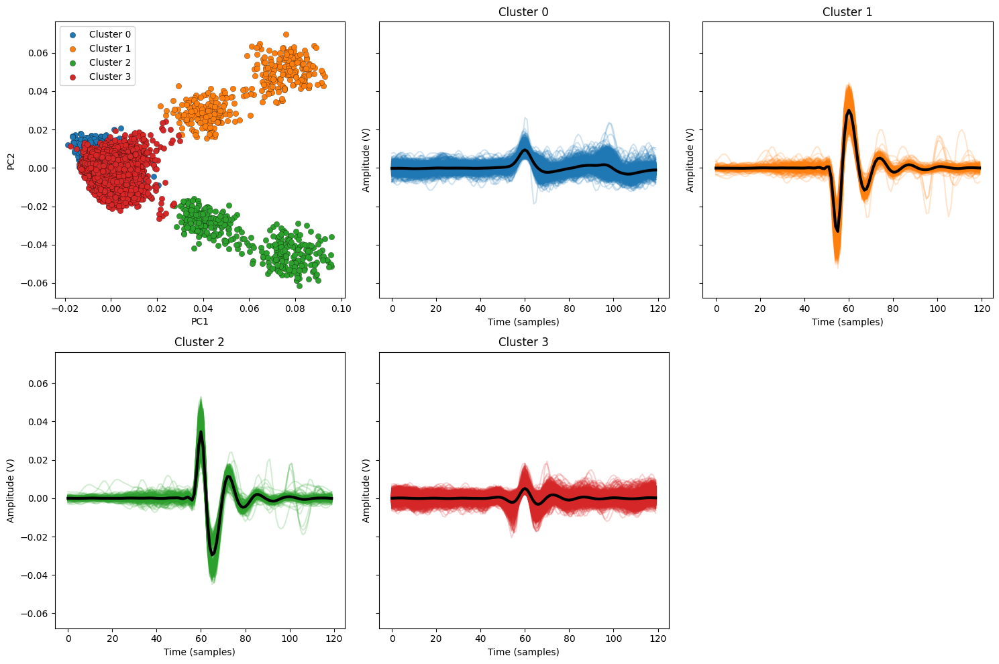

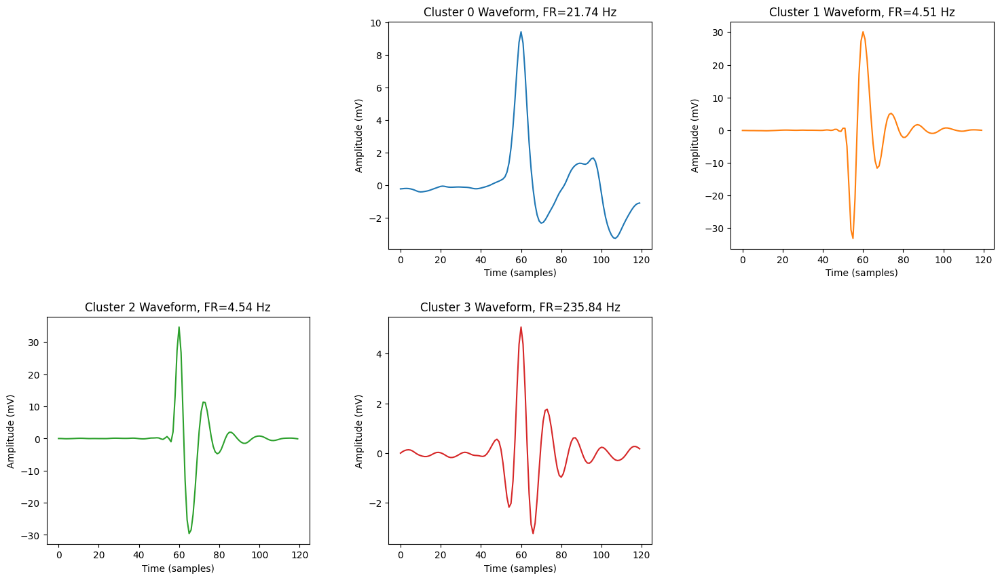

In [42]:
#recluster to view waveforms
num_clusters = 4
sortedSpine4.recluster(num_clusters)
sortedSpine4.plot_clusters()

n_cols = 3  # Number of columns in the grid
n_rows = (num_clusters + 1 + n_cols - 1) // n_cols

# Create the figure and gridspec layout
fig = plt.figure(figsize=(18, n_rows * 5))
gs = gridspec.GridSpec(n_rows, n_cols, wspace=0.3, hspace=0.3)

# Add an empty subplot at the first grid position (top-left)
ax_blank = fig.add_subplot(gs[0])
ax_blank.axis('off')  # Turn off the axis to make it blank

# Loop through the clusters and plot in the grid (starting from the second grid slot)
for i in range(num_clusters):
    temp = sortedSpine4.get_cluster_waveforms(i)
    
    # Average across the first axis (axis=0)
    temp_avg = np.mean(temp, axis=0)
    
    # Convert averaged waveform from V to mV by multiplying by 1000
    temp_mV = temp_avg * 1000
    n = temp.shape[0]
    EstimatedFR = n / 80
    
    # Create subplot at the appropriate position in the grid, starting from the second grid position
    ax = fig.add_subplot(gs[i + 1])  # Start from index 1 (second position)
    
    # Plot the averaged waveform using the default palette colors (C0, C1, etc.)
    ax.plot(temp_mV, color=f'C{i}')
    
    # Set title and labels
    ax.set_title(f'Cluster {i} Waveform, FR={EstimatedFR:.2f} Hz')
    ax.set_ylabel('Amplitude (mV)')  # Label the y-axis in mV
    ax.set_xlabel('Time (samples)')  # Adjust as needed for your x-axis

# Show the full grid of plots
plt.show()

## Cluster Compare to Spontaneous

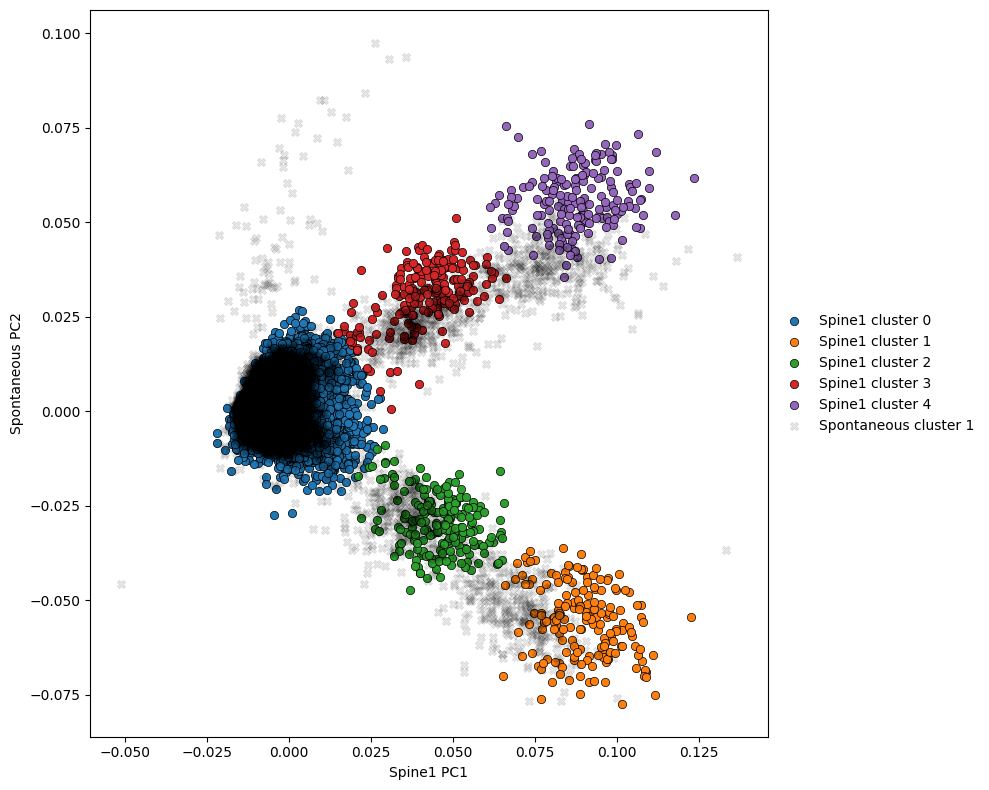

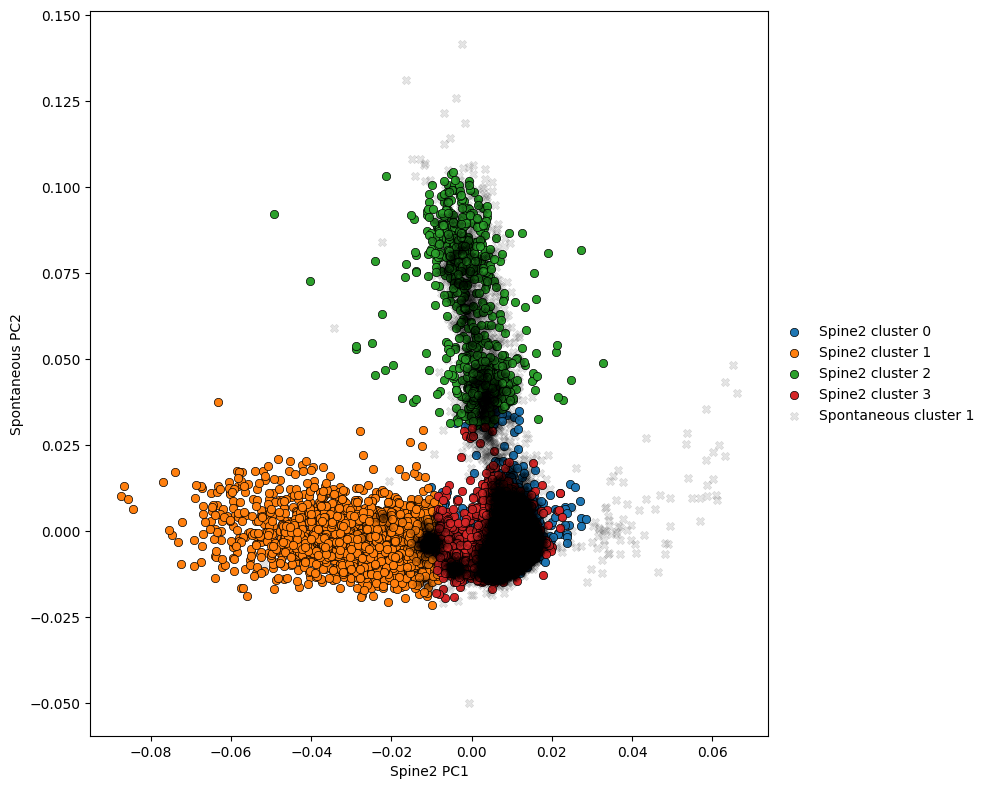

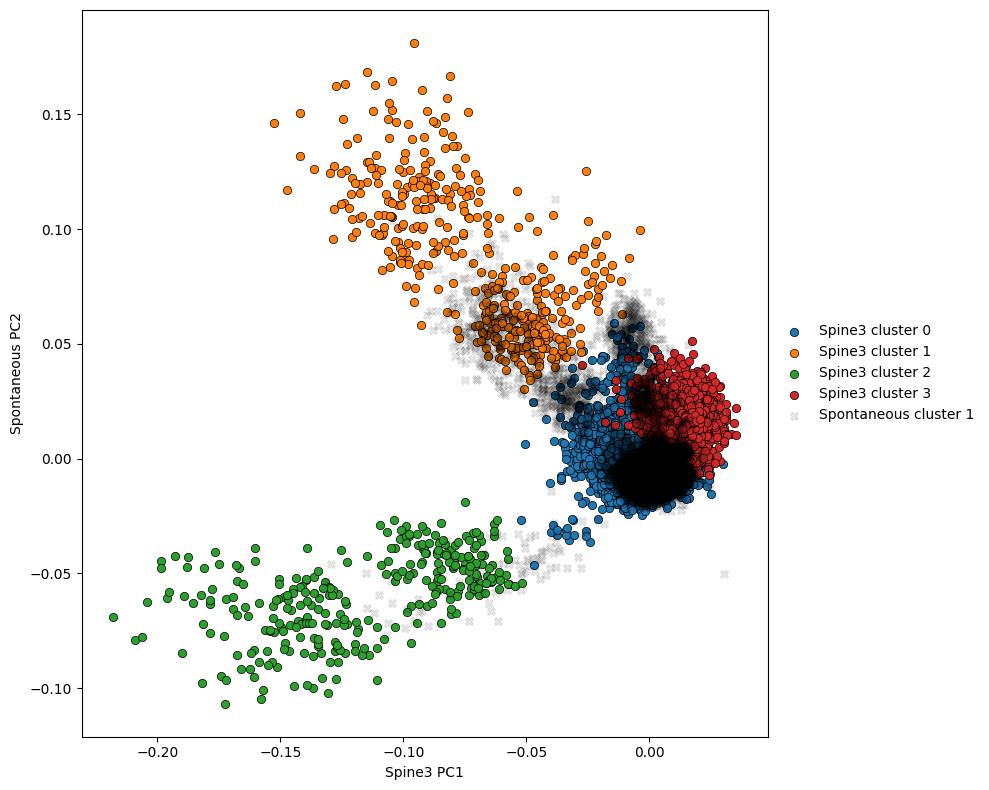

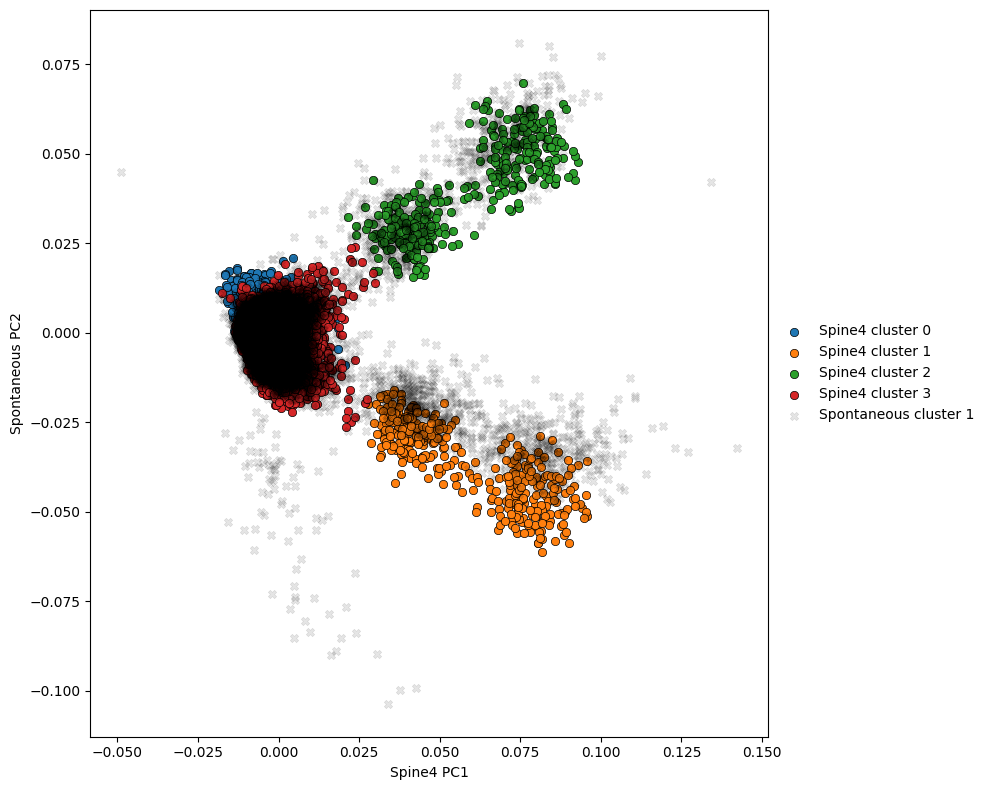

In [30]:
#PCA cluster compare
group_1_transformed, group_2_transformed = compare_clusters(sortedSpine1, sortedSpontaneous, 'Spine1', 'Spontaneous')
group_1_transformed, group_2_transformed = compare_clusters(sortedSpine2, sortedSpontaneous, 'Spine2', 'Spontaneous')
group_1_transformed, group_2_transformed = compare_clusters(sortedSpine3, sortedSpontaneous, 'Spine3', 'Spontaneous')
group_1_transformed, group_2_transformed = compare_clusters(sortedSpine4, sortedSpontaneous, 'Spine4', 'Spontaneous')

(18544, 120)


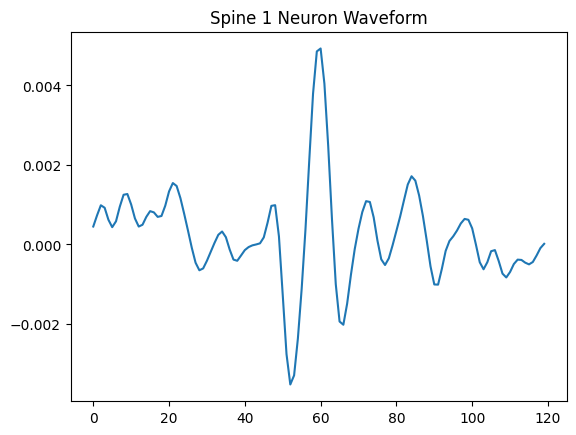

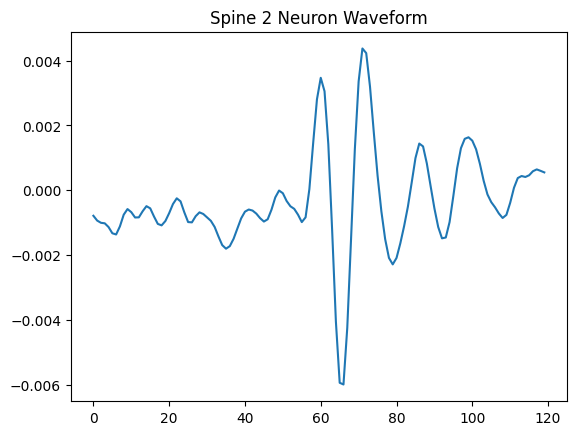

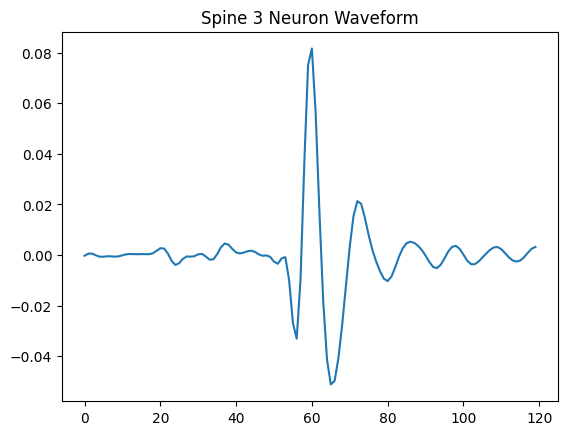

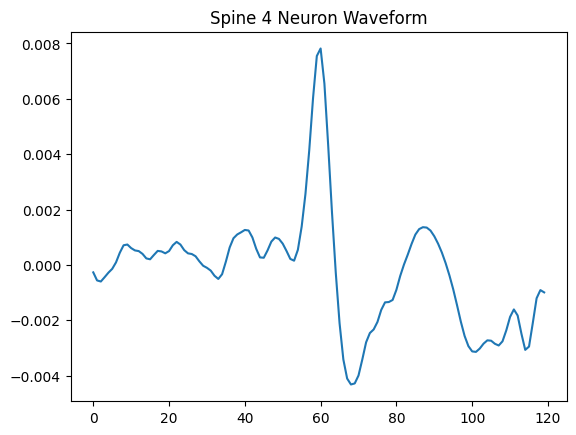

In [31]:
#pick out clusters for analysis
spine1neuron = sortedSpine1.get_cluster_waveforms(0)
print(spine1neuron.shape)
plt.plot(spine1neuron[0])
plt.title('Spine 1 Neuron Waveform')
plt.show()

spine2neuron = sortedSpine2.get_cluster_waveforms(0)
plt.plot(spine2neuron[0])
plt.title('Spine 2 Neuron Waveform')
plt.show()

spine3neuron = sortedSpine3.get_cluster_waveforms(1)
plt.plot(spine3neuron[0])
plt.title('Spine 3 Neuron Waveform')
plt.show()

spine4neuron = sortedSpine4.get_cluster_waveforms(0)
plt.plot(spine4neuron[0])
plt.title('Spine 4 Neuron Waveform')
plt.show()

# Amplitude Specific Sorting
## Spine 1 Sort By Amp

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/2796650600.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


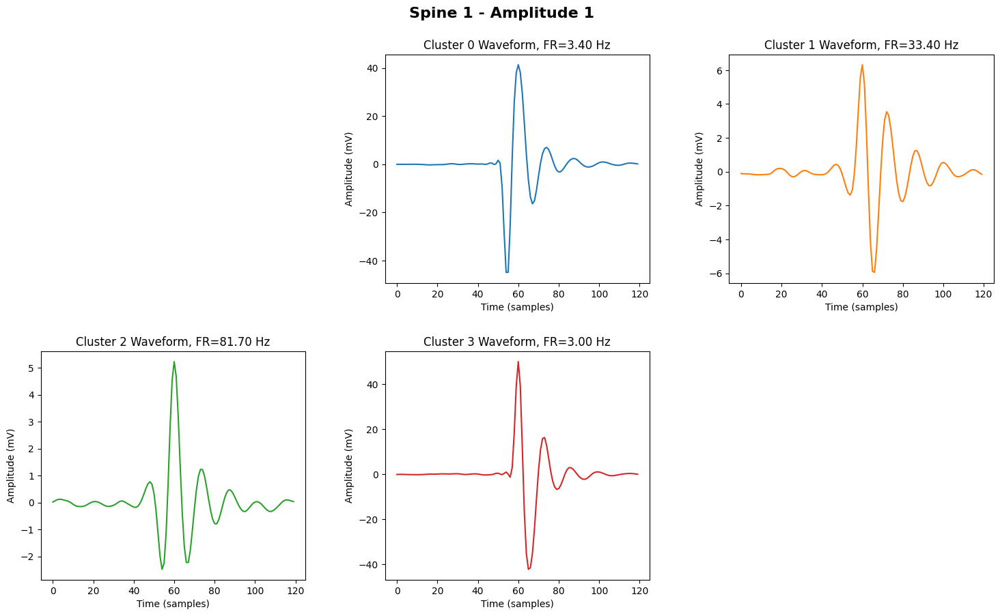

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/2796650600.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


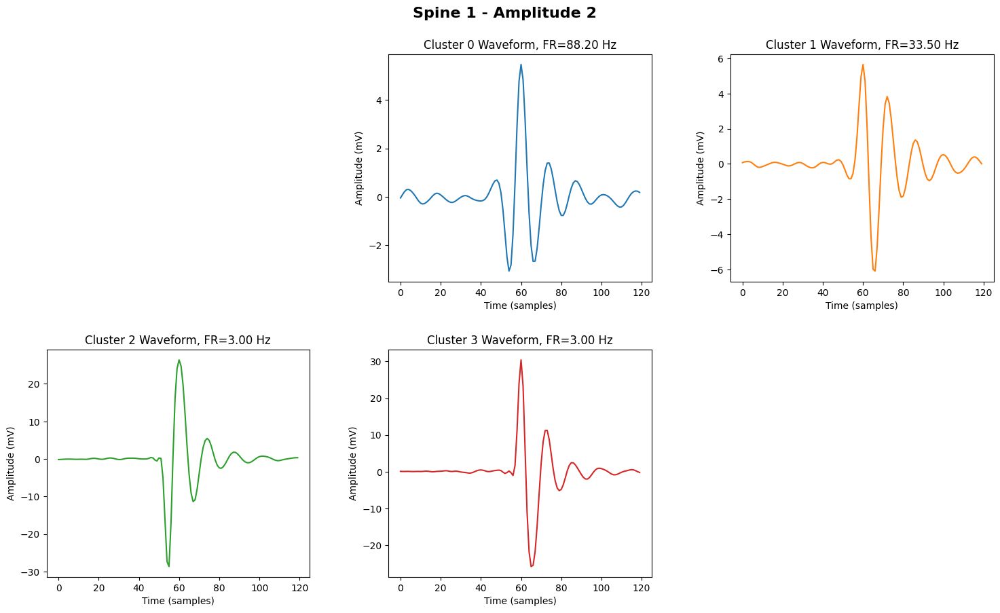

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/2796650600.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


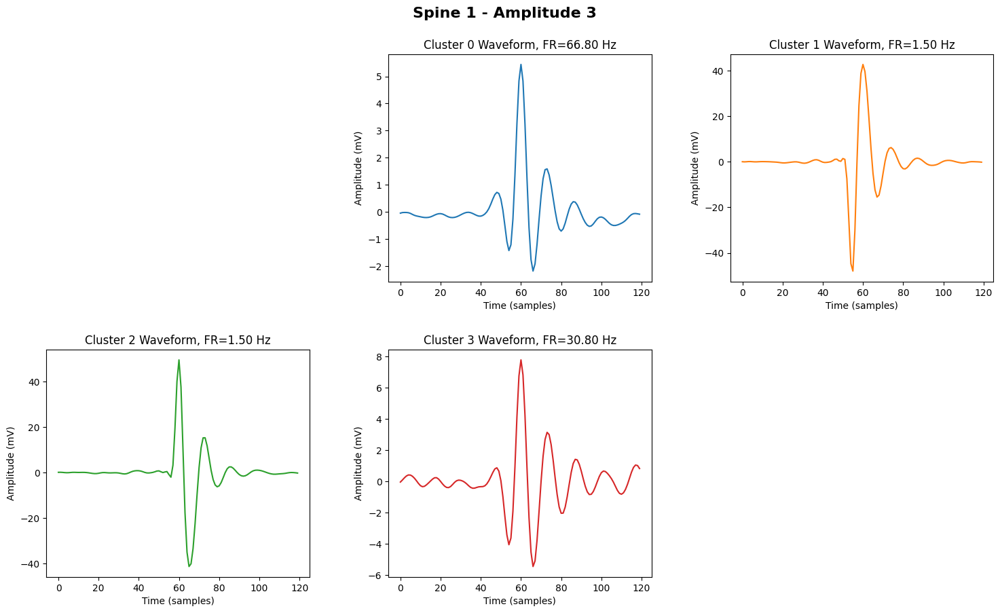

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/2796650600.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


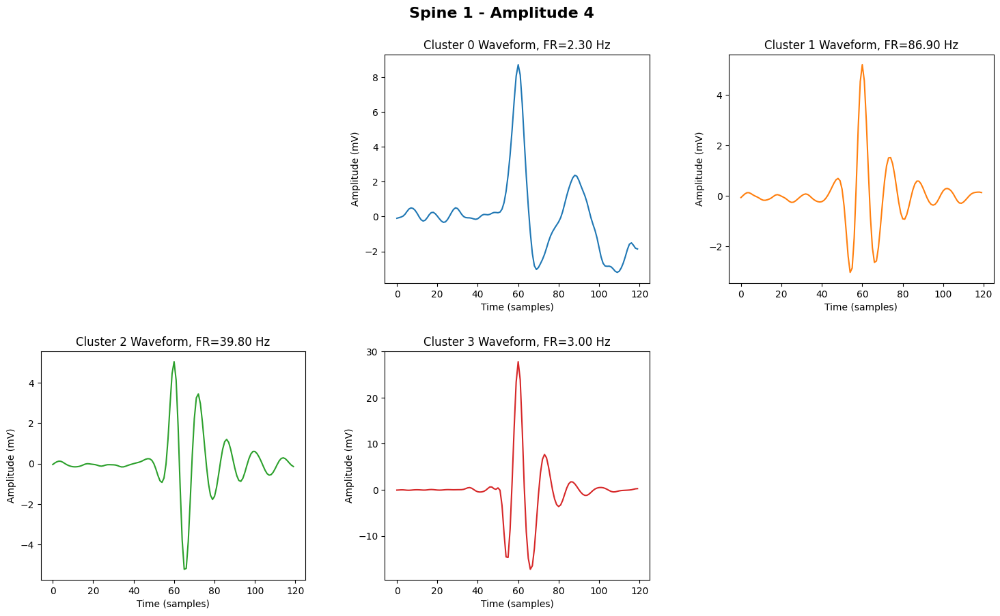

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/2796650600.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


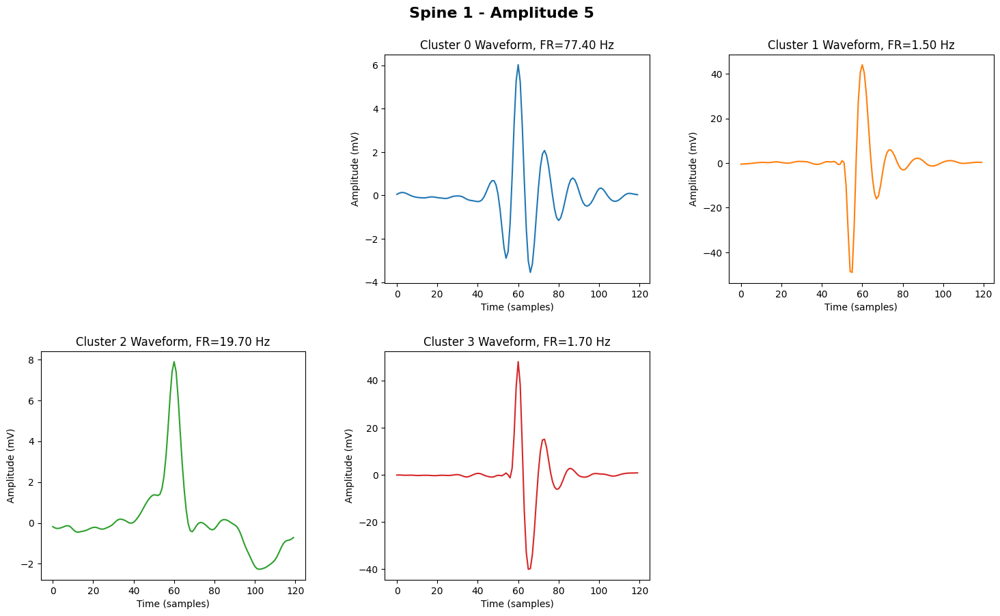

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/2796650600.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


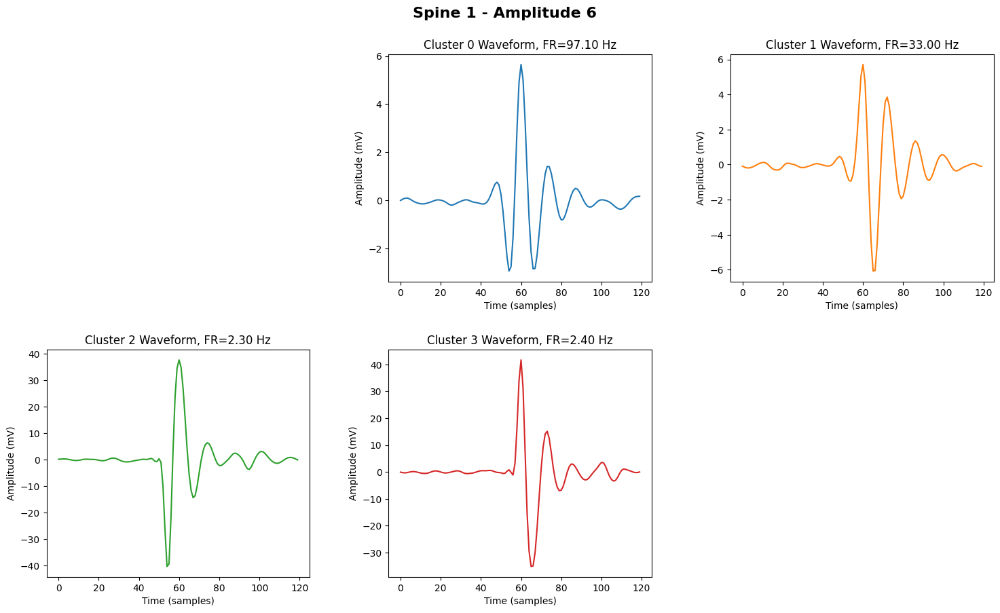

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/2796650600.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


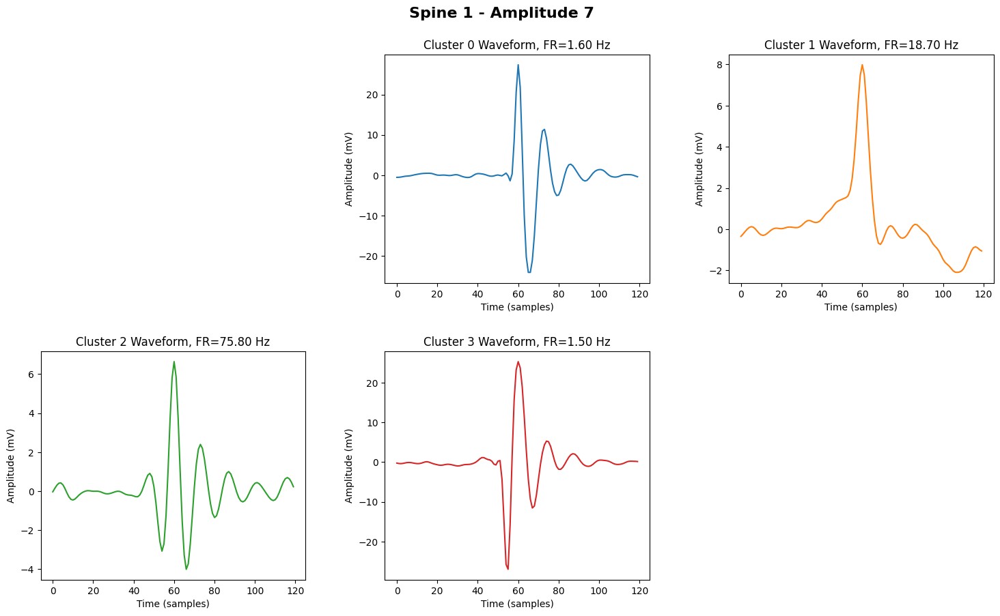

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/2796650600.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


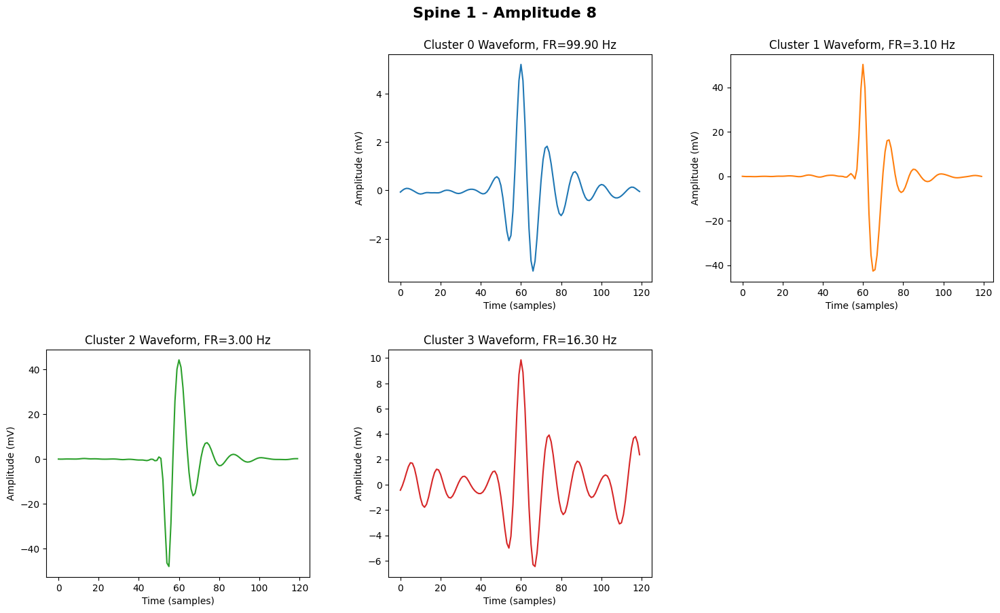

In [57]:
spine1AmpArrays = splitByStim(spine1concat)
num_clusters = 4

spine1amp1 = spine1AmpArrays[0]
spine1amp2 = spine1AmpArrays[1]
spine1amp3 = spine1AmpArrays[2]
spine1amp4 = spine1AmpArrays[3]
spine1amp5 = spine1AmpArrays[4]
spine1amp6 = spine1AmpArrays[5]
spine1amp7 = spine1AmpArrays[6]
spine1amp8 = spine1AmpArrays[7]

n_cols = 3  # Number of columns for gridspec layout
for i, spine_amp in enumerate(spine1AmpArrays):
    
    # Sort spikes for the current amplitude
    sortedSpine = ntk.sort_spikes(spine_amp[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window=40 * 3, cluster_dimensions=10)
    globals()[f'S1A{i+1}sorted'] = sortedSpine
    
    # Perform reclustering and plot clusters
    sortedSpine.recluster(num_clusters)
    #sortedSpine.plot_clusters()

    # Create figure for the grid layout
    n_rows = (num_clusters + 1 + n_cols - 1) // n_cols  # Rows based on num_clusters and n_cols
    fig = plt.figure(figsize=(18, n_rows * 5))
    gs = gridspec.GridSpec(n_rows, n_cols, wspace=0.3, hspace=0.3)
    fig.suptitle(f'Spine 1 - Amplitude {i+1}', fontsize=16, fontweight='bold', y=0.95)
    
    # Add an empty subplot at the first grid position (top-left)
    ax_blank = fig.add_subplot(gs[0])
    ax_blank.axis('off')  # Turn off the axis to make it blank
    
    # Loop through clusters and plot the waveforms
    for cluster_idx in range(num_clusters):
        temp = sortedSpine.get_cluster_waveforms(cluster_idx)
        
        # Average across the first axis (axis=0)
        temp_avg = np.mean(temp, axis=0)
        
        # Convert averaged waveform from V to mV by multiplying by 1000
        temp_mV = temp_avg * 1000
        n = temp.shape[0]
        EstimatedFR = n / 10
        
        # Create subplot for each cluster, starting from the second grid slot
        ax = fig.add_subplot(gs[cluster_idx + 1])
        ax.plot(temp_mV, color=f'C{cluster_idx}')
        
        # Set title and labels
        ax.set_title(f'Cluster {cluster_idx} Waveform, FR={EstimatedFR:.2f} Hz')
        ax.set_ylabel('Amplitude (mV)')
        ax.set_xlabel('Time (samples)')
    
    # Compare clusters with spontaneous activity
    #group_1_transformed, group_2_transformed = compare_clusters(sortedSpine, sortedSpontaneous, f'Spine{i+1}', 'Spontaneous')
    
    # Show the grid of cluster plots for the current amplitude
    plt.tight_layout()
    plt.show()
    

## Spine 2 Sort By Amp

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1562638212.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


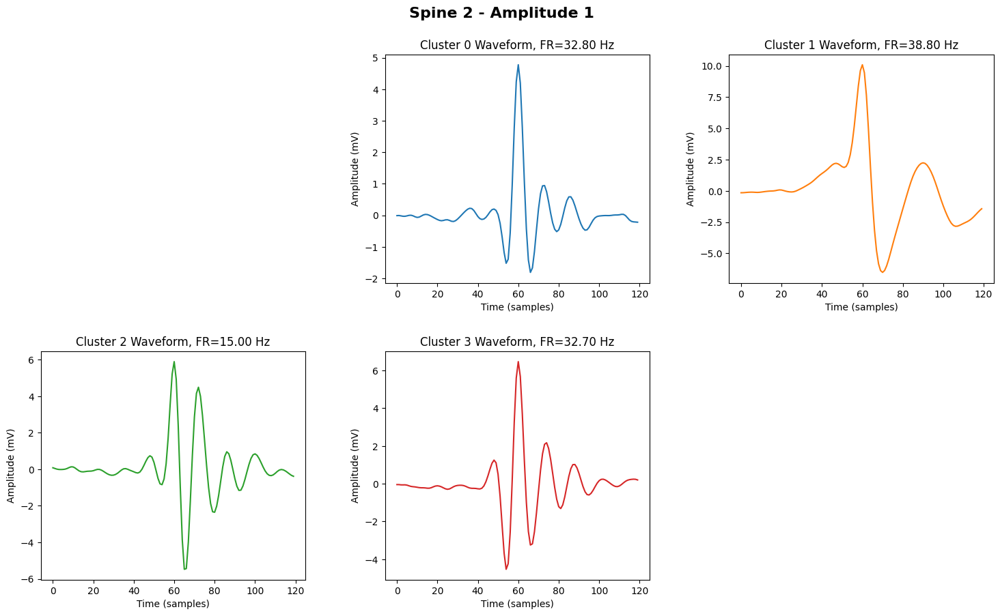

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1562638212.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


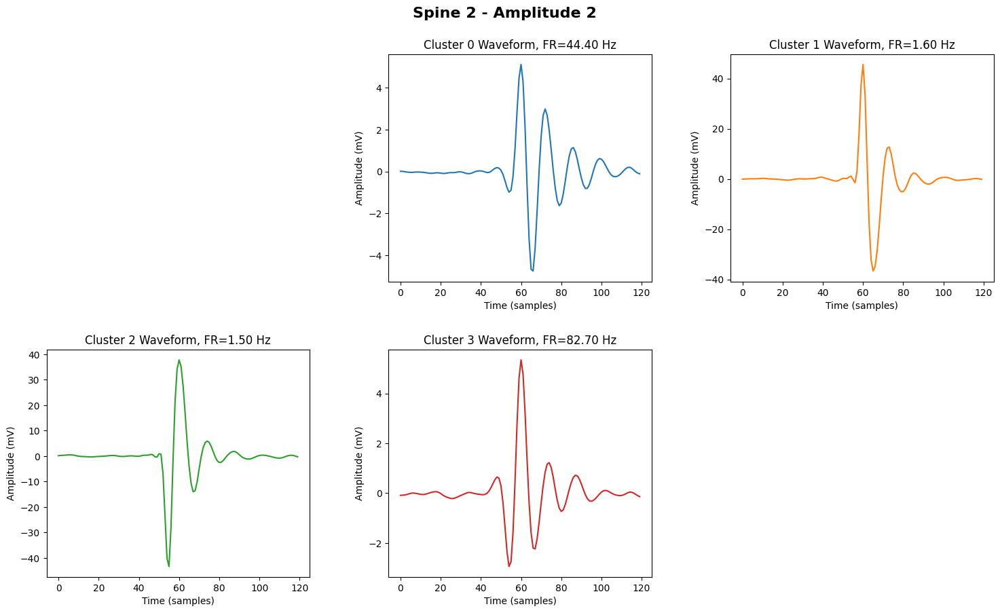

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1562638212.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


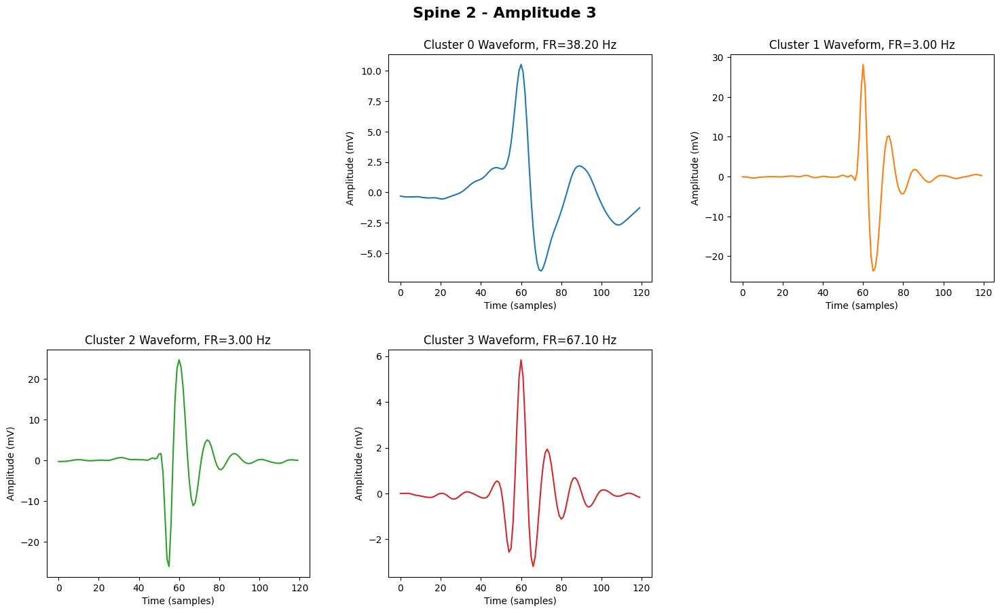

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1562638212.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


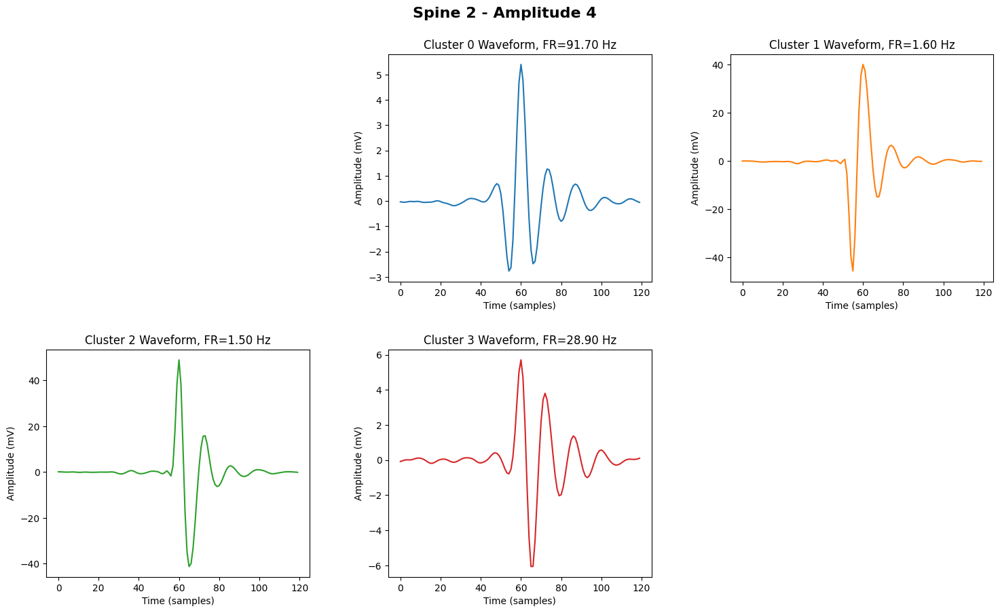

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1562638212.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


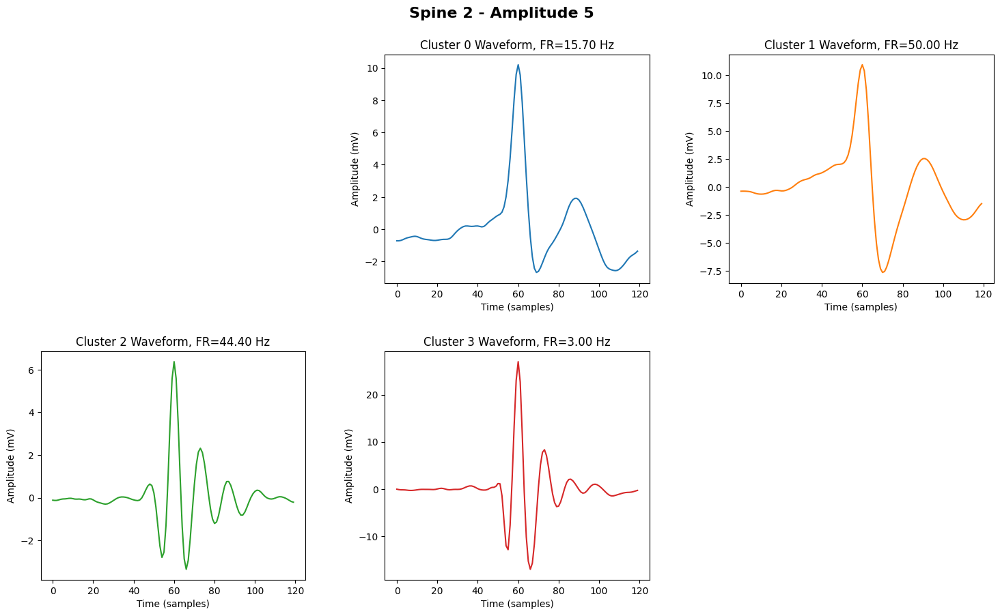

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1562638212.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


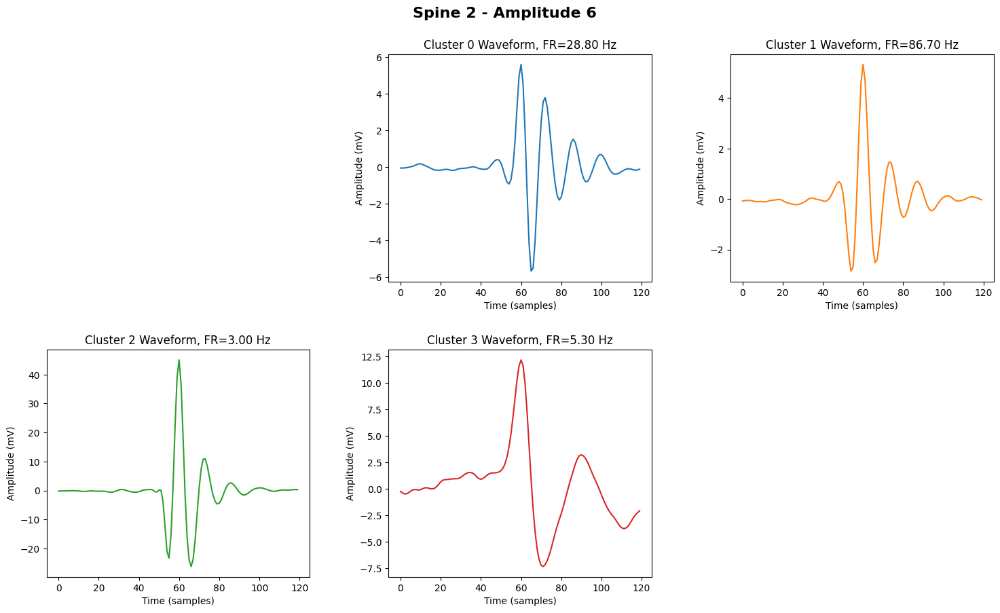

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1562638212.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


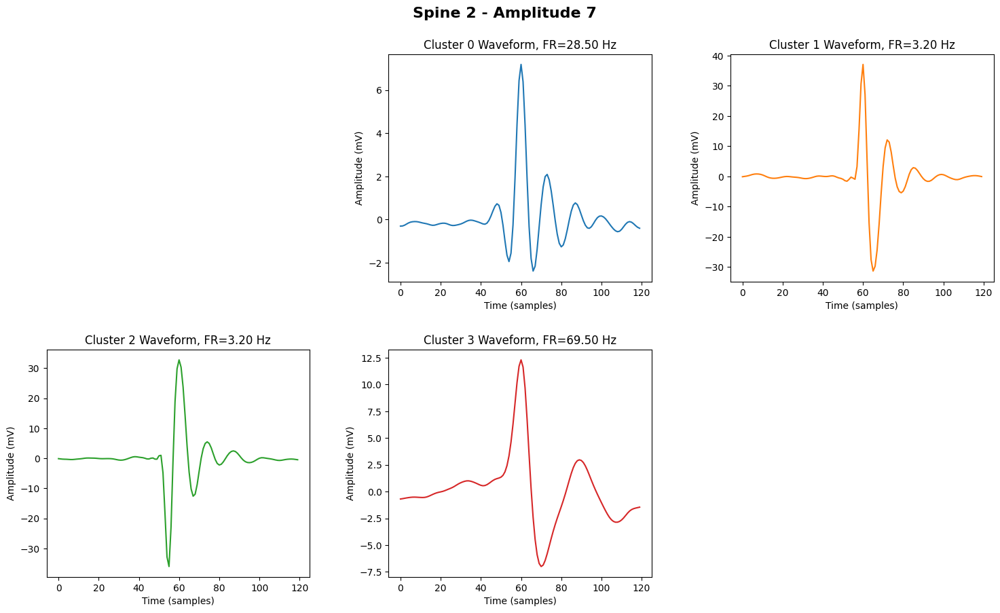

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/1562638212.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


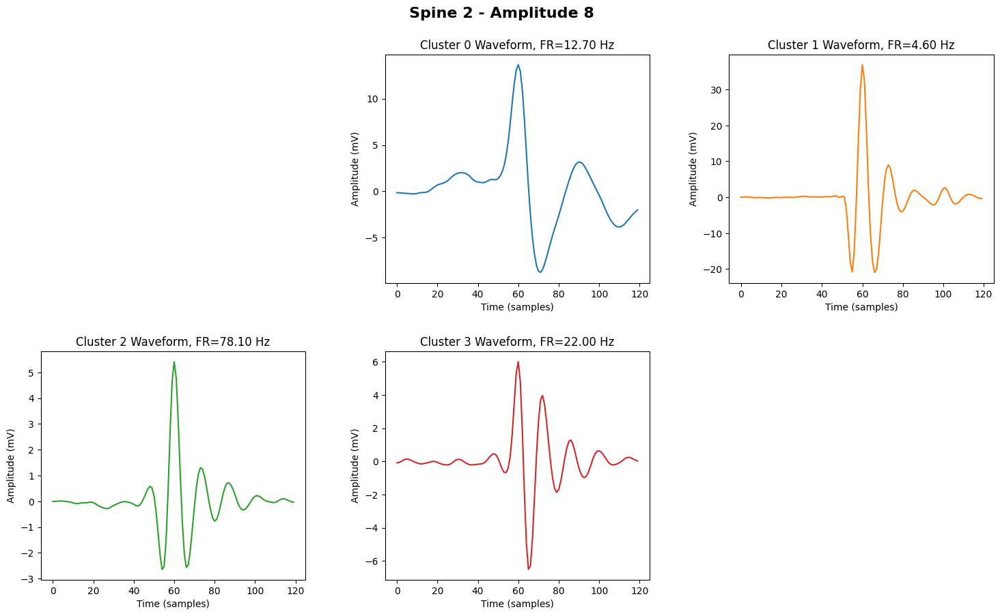

In [56]:
#amplitude specific sorting for spine 2
spine2AmpArrays = splitByStim(spine2concat)
num_clusters = 4

spine2amp1 = spine2AmpArrays[0]
spine2amp2 = spine2AmpArrays[1]
spine2amp3 = spine2AmpArrays[2]
spine2amp4 = spine2AmpArrays[3]
spine2amp5 = spine2AmpArrays[4]
spine2amp6 = spine2AmpArrays[5]
spine2amp7 = spine2AmpArrays[6]
spine2amp8 = spine2AmpArrays[7]

n_cols = 3  # Number of columns for gridspec layout
for i, spine_amp in enumerate(spine2AmpArrays):
    
    # Sort spikes for the current amplitude
    sortedSpine = ntk.sort_spikes(spine_amp[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window=40 * 3, cluster_dimensions=10)
    globals()[f'S1A{i+1}sorted'] = sortedSpine
    
    # Perform reclustering and plot clusters
    sortedSpine.recluster(num_clusters)
    #sortedSpine.plot_clusters()

    # Create figure for the grid layout
    n_rows = (num_clusters + 1 + n_cols - 1) // n_cols  # Rows based on num_clusters and n_cols
    fig = plt.figure(figsize=(18, n_rows * 5))
    gs = gridspec.GridSpec(n_rows, n_cols, wspace=0.3, hspace=0.3)
    fig.suptitle(f'Spine 2 - Amplitude {i+1}', fontsize=16, fontweight='bold', y=0.95)
    
    # Add an empty subplot at the first grid position (top-left)
    ax_blank = fig.add_subplot(gs[0])
    ax_blank.axis('off')  # Turn off the axis to make it blank
    
    # Loop through clusters and plot the waveforms
    for cluster_idx in range(num_clusters):
        temp = sortedSpine.get_cluster_waveforms(cluster_idx)
        
        # Average across the first axis (axis=0)
        temp_avg = np.mean(temp, axis=0)
        
        # Convert averaged waveform from V to mV by multiplying by 1000
        temp_mV = temp_avg * 1000
        n = temp.shape[0]
        EstimatedFR = n / 10
        
        # Create subplot for each cluster, starting from the second grid slot
        ax = fig.add_subplot(gs[cluster_idx + 1])
        ax.plot(temp_mV, color=f'C{cluster_idx}')
        
        # Set title and labels
        ax.set_title(f'Cluster {cluster_idx} Waveform, FR={EstimatedFR:.2f} Hz')
        ax.set_ylabel('Amplitude (mV)')
        ax.set_xlabel('Time (samples)')
    
    # Compare clusters with spontaneous activity
    #group_1_transformed, group_2_transformed = compare_clusters(sortedSpine, sortedSpontaneous, f'Spine{i+1}', 'Spontaneous')
    
    # Show the grid of cluster plots for the current amplitude
    plt.tight_layout()
    plt.show()

## Spine 3 Sort By Amp

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/609562106.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


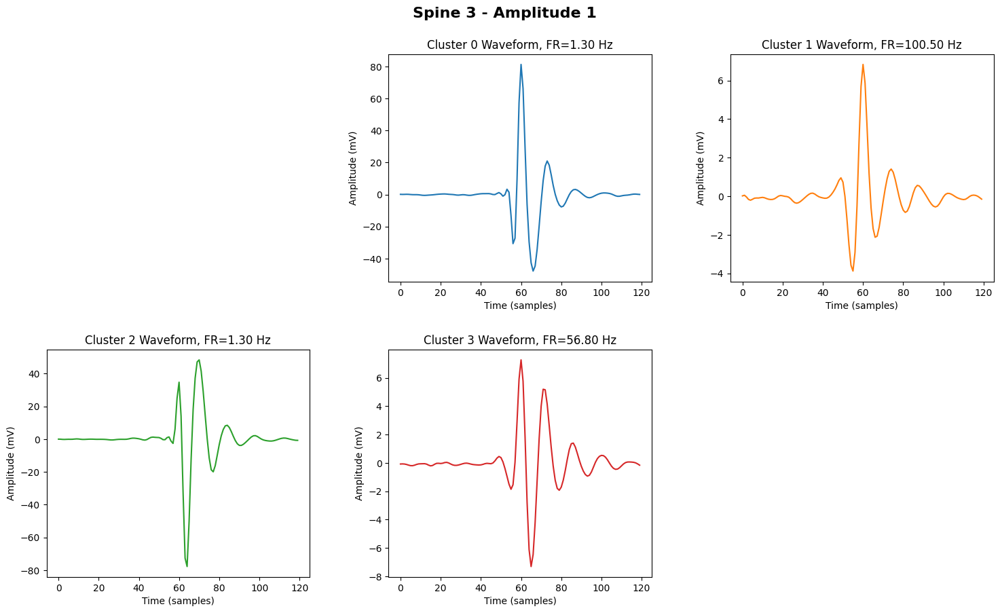

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/609562106.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


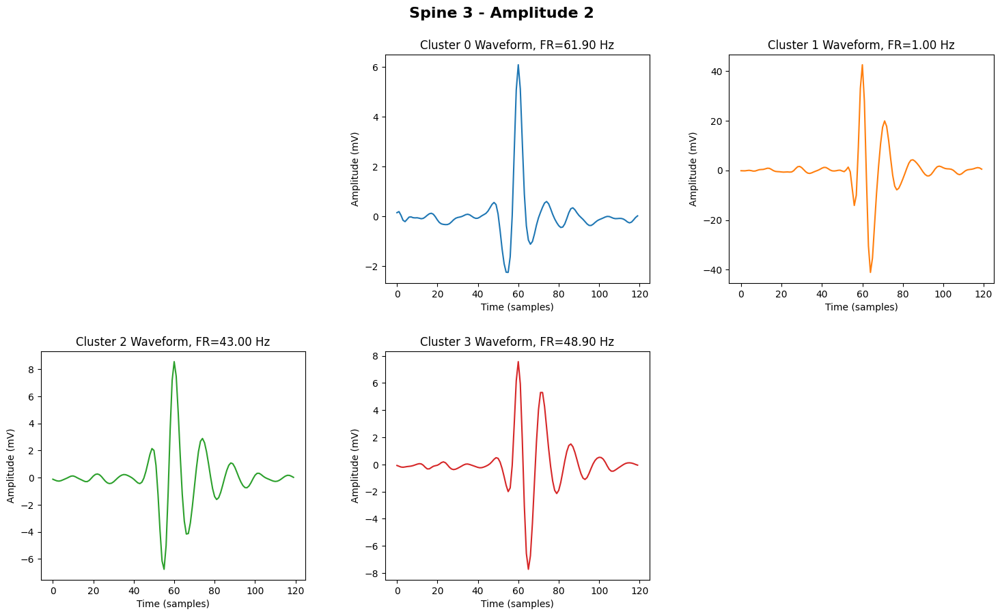

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/609562106.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


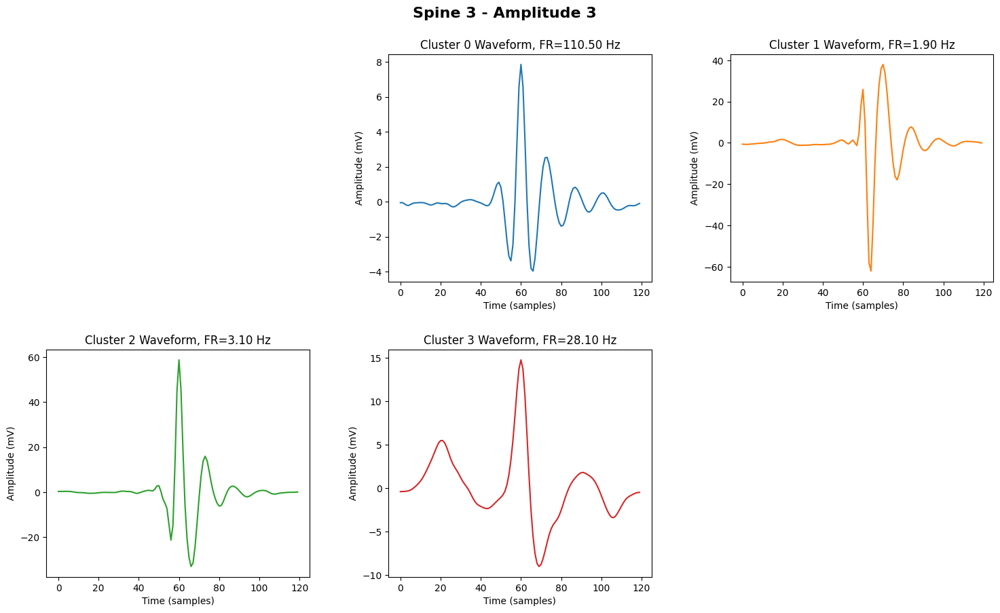

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/609562106.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


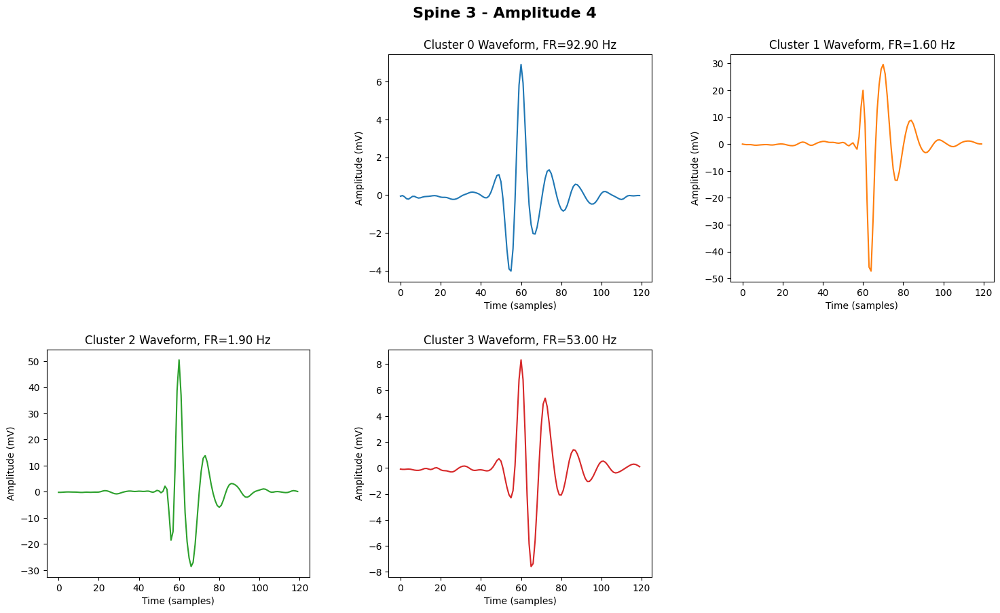

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/609562106.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


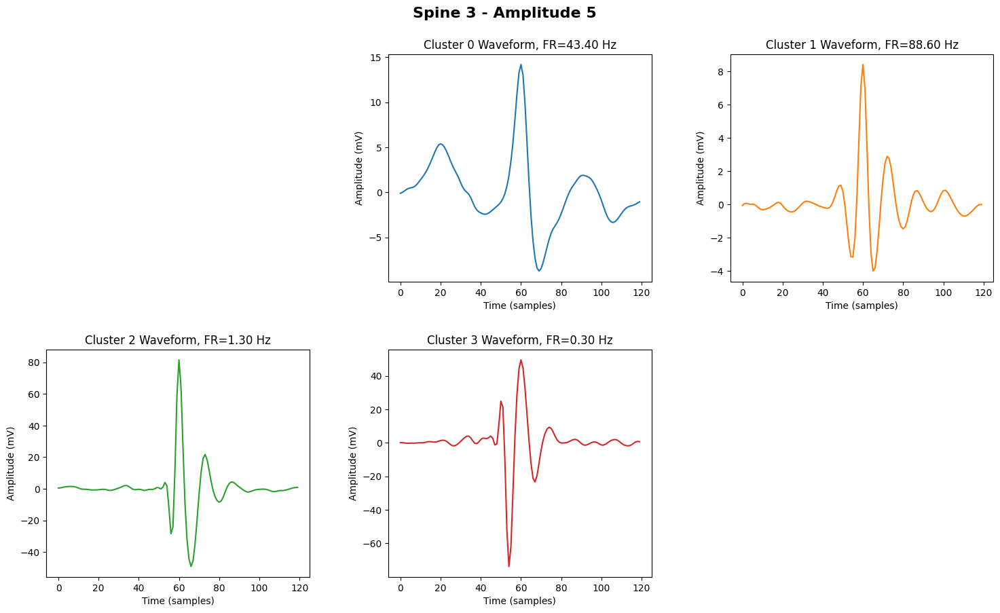

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/609562106.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


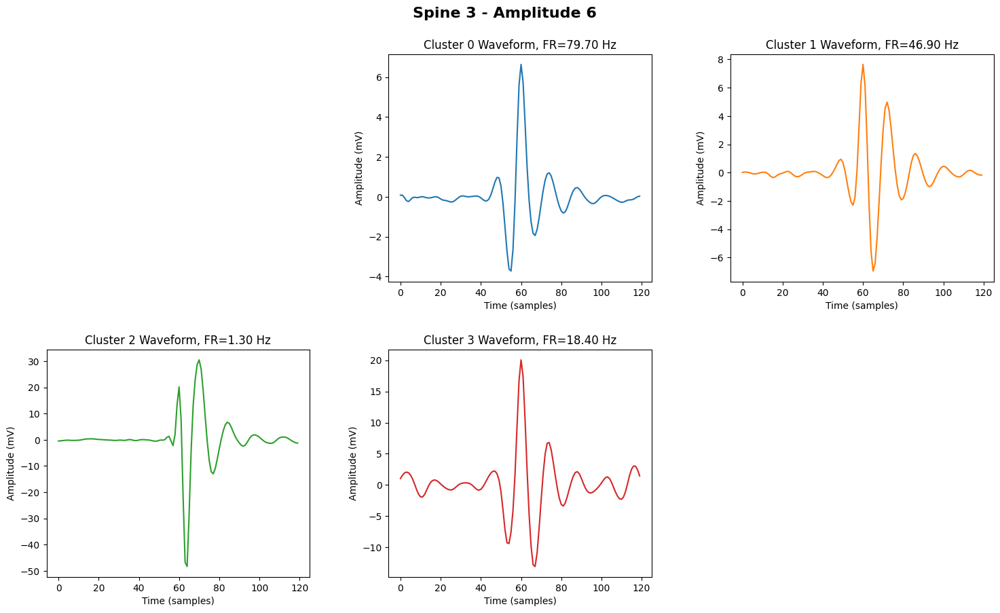

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/609562106.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


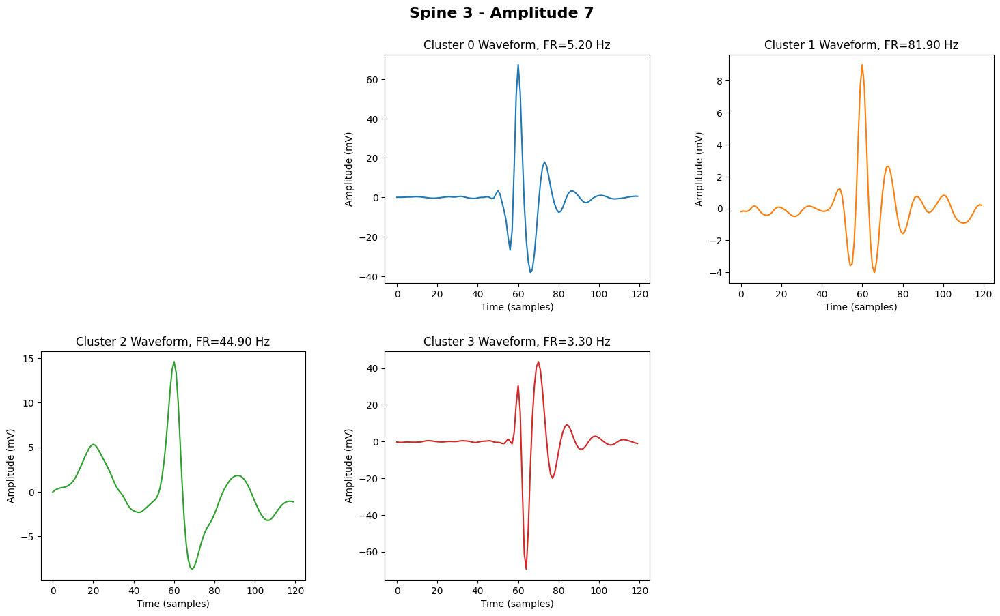

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/609562106.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


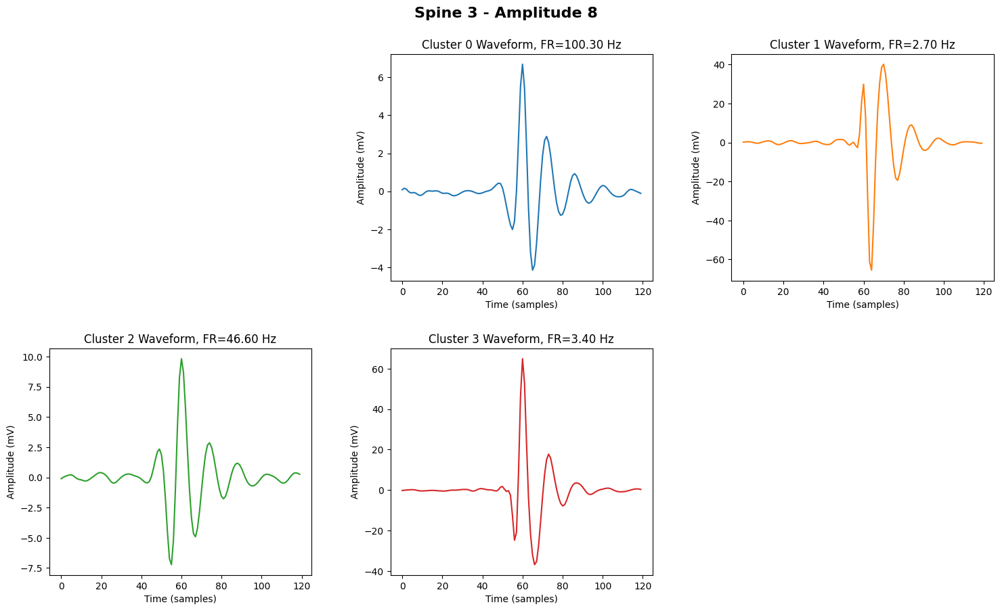

In [55]:
#amplitude specific sorting for spine 3
spine3AmpArrays = splitByStim(spine3concat)
num_clusters = 4

spine3amp1 = spine3AmpArrays[0]
spine3amp2 = spine3AmpArrays[1]
spine3amp3 = spine3AmpArrays[2]
spine3amp4 = spine3AmpArrays[3]
spine3amp5 = spine3AmpArrays[4]
spine3amp6 = spine3AmpArrays[5]
spine3amp7 = spine3AmpArrays[6]
spine3amp8 = spine3AmpArrays[7]

n_cols = 3  # Number of columns for gridspec layout
for i, spine_amp in enumerate(spine3AmpArrays):
    
    # Sort spikes for the current amplitude
    sortedSpine = ntk.sort_spikes(spine_amp[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window=40 * 3, cluster_dimensions=10)
    globals()[f'S1A{i+1}sorted'] = sortedSpine
    
    # Perform reclustering and plot clusters
    sortedSpine.recluster(num_clusters)
    #sortedSpine.plot_clusters()

    # Create figure for the grid layout
    n_rows = (num_clusters + 1 + n_cols - 1) // n_cols  # Rows based on num_clusters and n_cols
    fig = plt.figure(figsize=(18, n_rows * 5))
    gs = gridspec.GridSpec(n_rows, n_cols, wspace=0.3, hspace=0.3)
    fig.suptitle(f'Spine 3 - Amplitude {i+1}', fontsize=16, fontweight='bold', y=0.95)
    
    # Add an empty subplot at the first grid position (top-left)
    ax_blank = fig.add_subplot(gs[0])
    ax_blank.axis('off')  # Turn off the axis to make it blank
    
    # Loop through clusters and plot the waveforms
    for cluster_idx in range(num_clusters):
        temp = sortedSpine.get_cluster_waveforms(cluster_idx)
        
        # Average across the first axis (axis=0)
        temp_avg = np.mean(temp, axis=0)
        
        # Convert averaged waveform from V to mV by multiplying by 1000
        temp_mV = temp_avg * 1000
        n = temp.shape[0]
        EstimatedFR = n / 10
        
        # Create subplot for each cluster, starting from the second grid slot
        ax = fig.add_subplot(gs[cluster_idx + 1])
        ax.plot(temp_mV, color=f'C{cluster_idx}')
        
        # Set title and labels
        ax.set_title(f'Cluster {cluster_idx} Waveform, FR={EstimatedFR:.2f} Hz')
        ax.set_ylabel('Amplitude (mV)')
        ax.set_xlabel('Time (samples)')
    
    # Compare clusters with spontaneous activity
    #group_1_transformed, group_2_transformed = compare_clusters(sortedSpine, sortedSpontaneous, f'Spine{i+1}', 'Spontaneous')
    
    # Show the grid of cluster plots for the current amplitude
    plt.tight_layout()
    plt.show()

## Spine 4 Sort By Amp

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/862241760.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


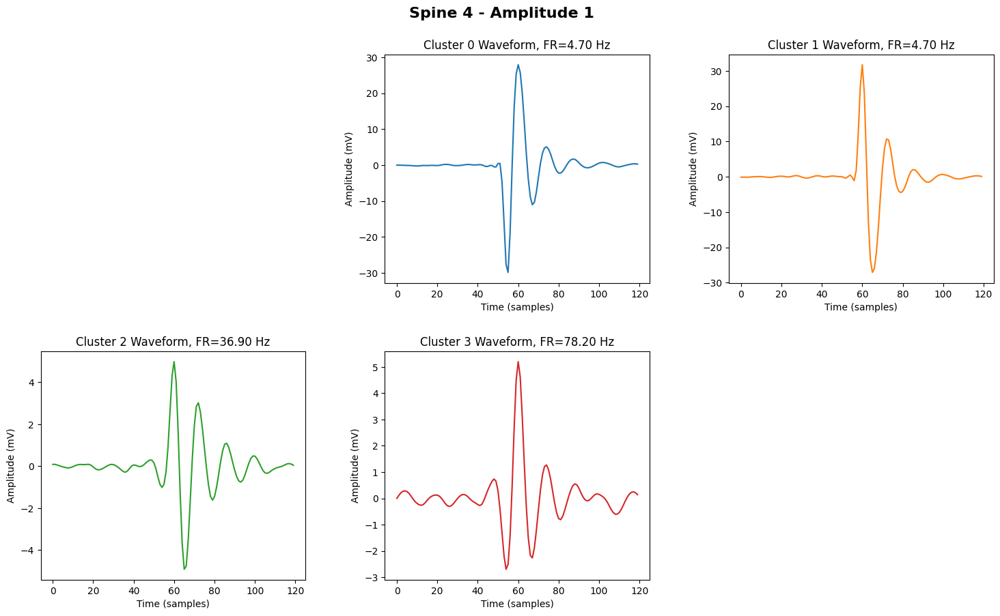

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/862241760.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


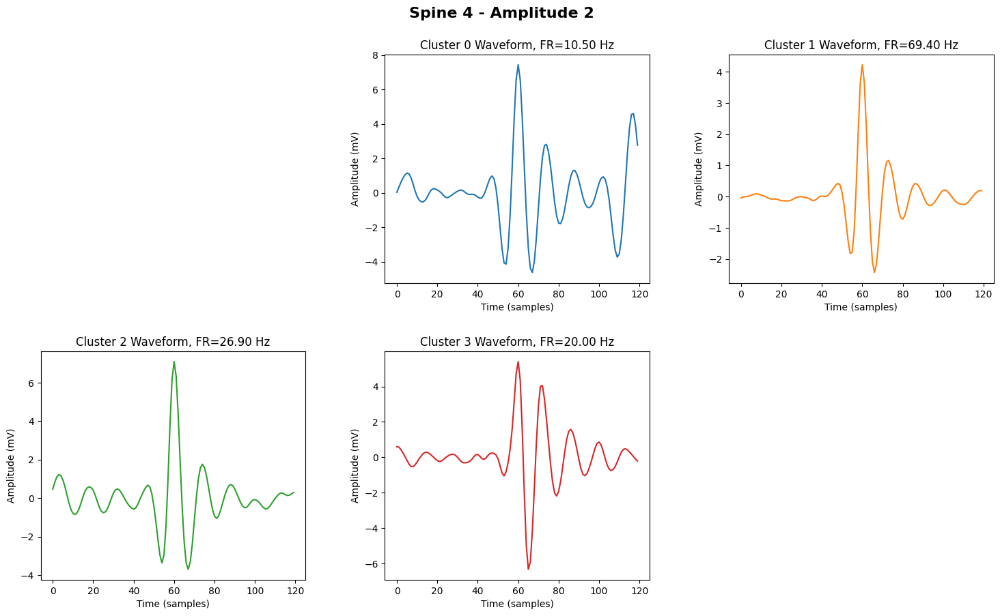

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/862241760.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


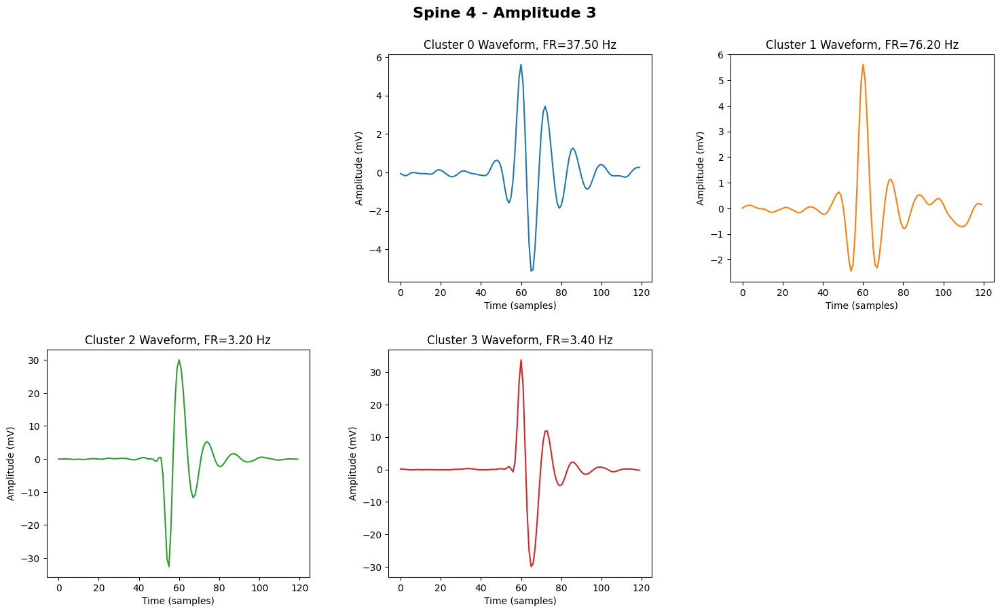

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/862241760.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


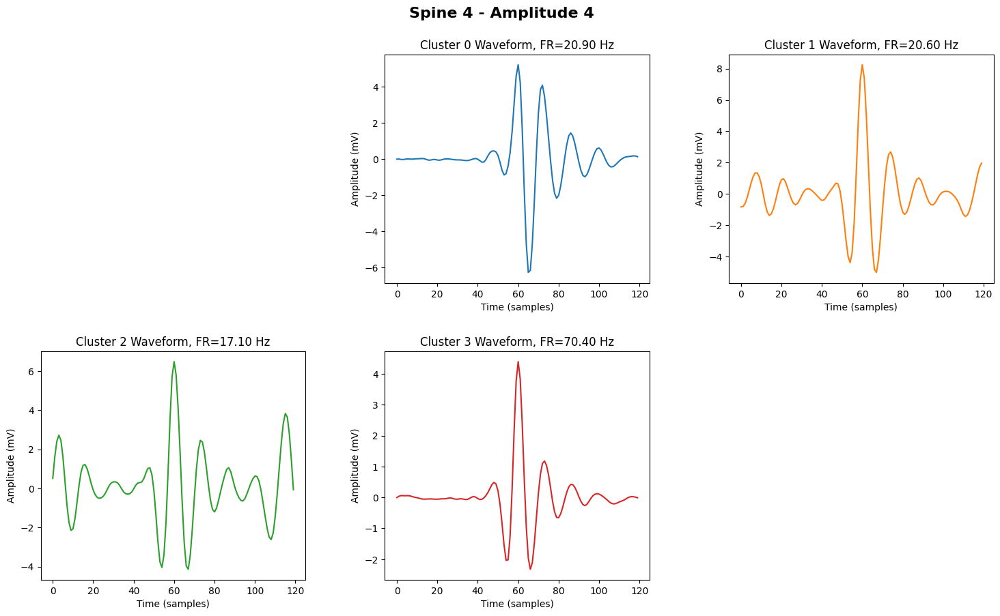

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/862241760.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


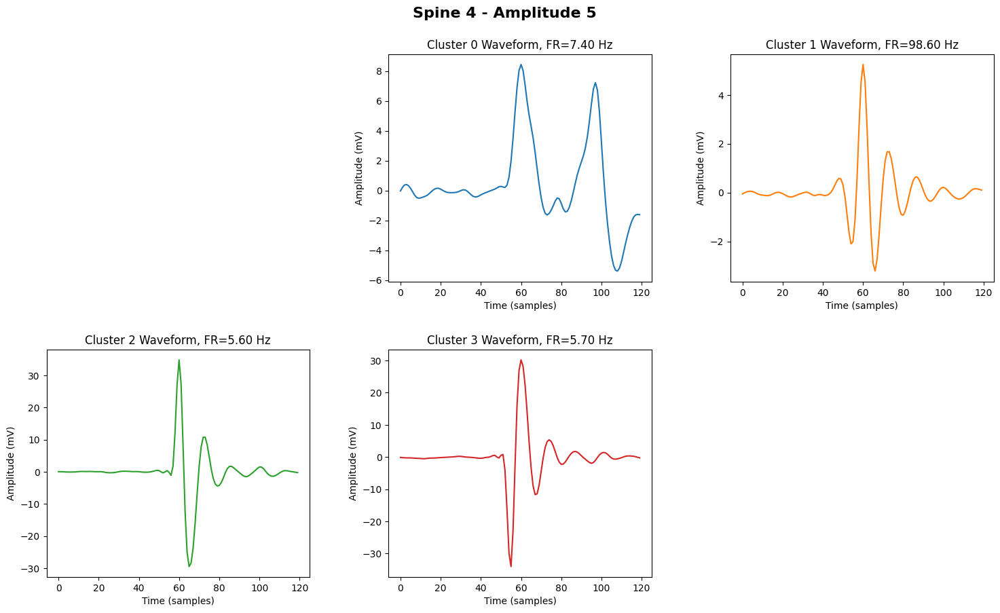

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/862241760.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


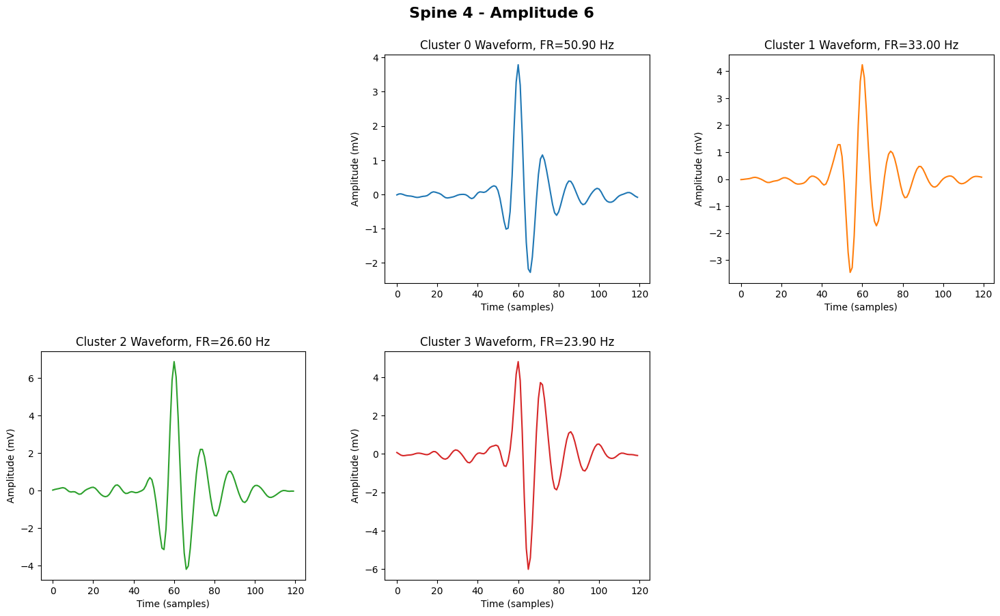

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/862241760.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


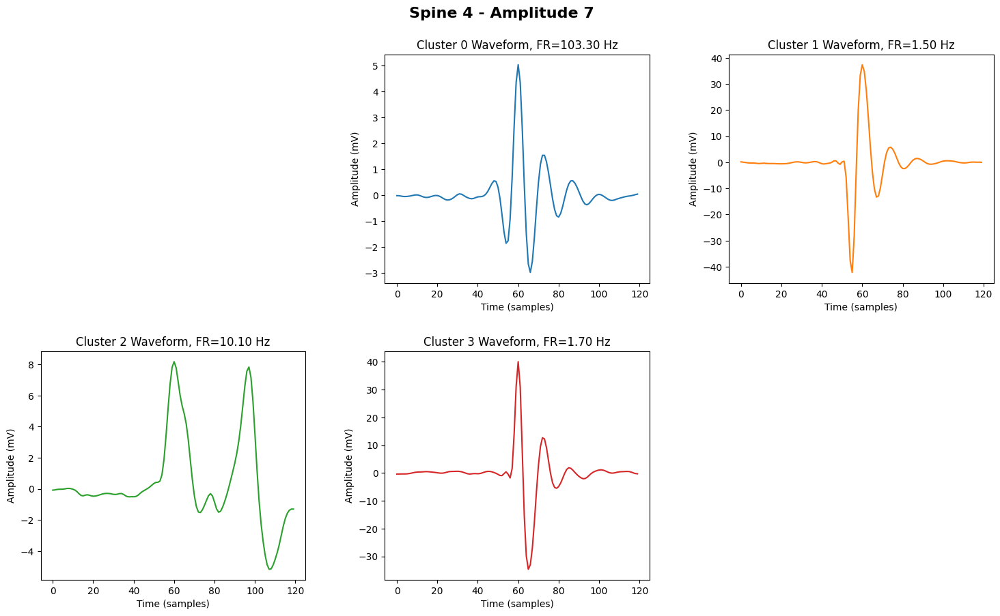

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/862241760.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


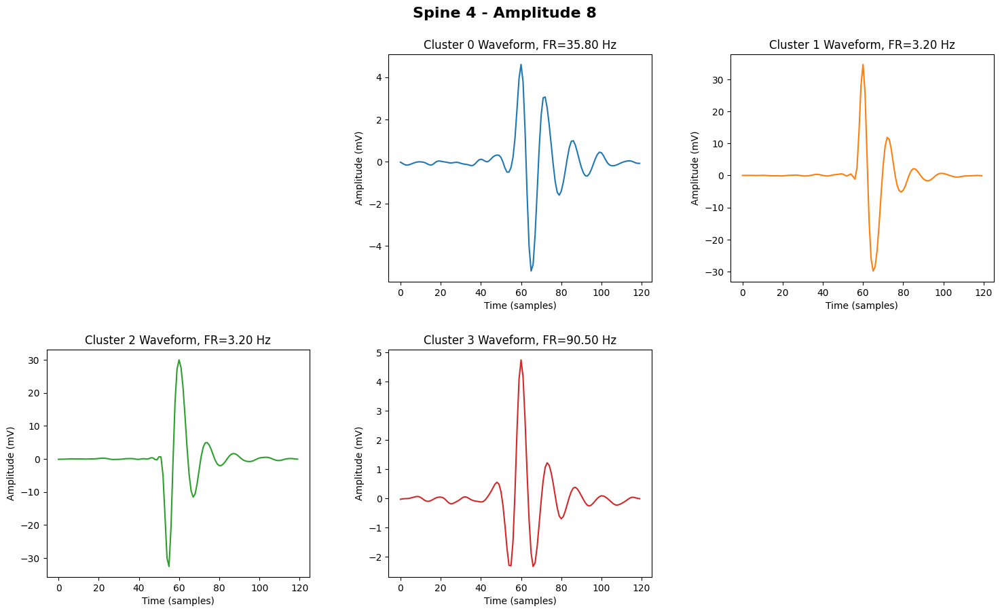

In [54]:
#amplitude specific sorting for spine 4
spine4AmpArrays = splitByStim(spine4concat)
num_clusters = 4

spine4amp1 = spine4AmpArrays[0]
spine4amp2 = spine4AmpArrays[1]
spine4amp3 = spine4AmpArrays[2]
spine4amp4 = spine4AmpArrays[3]
spine4amp5 = spine4AmpArrays[4]
spine4amp6 = spine4AmpArrays[5]
spine4amp7 = spine4AmpArrays[6]
spine4amp8 = spine4AmpArrays[7]


n_cols = 3  # Number of columns for gridspec layout
for i, spine_amp in enumerate(spine4AmpArrays):
    
    # Sort spikes for the current amplitude
    sortedSpine = ntk.sort_spikes(spine_amp[0], fs=dataset.fs, threshold_multiplier=thmp, waveform_window=40 * 3, cluster_dimensions=10)
    globals()[f'S1A{i+1}sorted'] = sortedSpine
    
    # Perform reclustering and plot clusters
    sortedSpine.recluster(num_clusters)
    #sortedSpine.plot_clusters()

    # Create figure for the grid layout
    n_rows = (num_clusters + 1 + n_cols - 1) // n_cols  # Rows based on num_clusters and n_cols
    fig = plt.figure(figsize=(18, n_rows * 5))
    gs = gridspec.GridSpec(n_rows, n_cols, wspace=0.3, hspace=0.3)
    fig.suptitle(f'Spine 4 - Amplitude {i+1}', fontsize=16, fontweight='bold', y=0.95)
    
    # Add an empty subplot at the first grid position (top-left)
    ax_blank = fig.add_subplot(gs[0])
    ax_blank.axis('off')  # Turn off the axis to make it blank
    
    # Loop through clusters and plot the waveforms
    for cluster_idx in range(num_clusters):
        temp = sortedSpine.get_cluster_waveforms(cluster_idx)
        
        # Average across the first axis (axis=0)
        temp_avg = np.mean(temp, axis=0)
        
        # Convert averaged waveform from V to mV by multiplying by 1000
        temp_mV = temp_avg * 1000
        n = temp.shape[0]
        EstimatedFR = n / 10
        
        # Create subplot for each cluster, starting from the second grid slot
        ax = fig.add_subplot(gs[cluster_idx + 1])
        ax.plot(temp_mV, color=f'C{cluster_idx}')
        
        # Set title and labels
        ax.set_title(f'Cluster {cluster_idx} Waveform, FR={EstimatedFR:.2f} Hz')
        ax.set_ylabel('Amplitude (mV)')
        ax.set_xlabel('Time (samples)')
    
    # Compare clusters with spontaneous activity
    #group_1_transformed, group_2_transformed = compare_clusters(sortedSpine, sortedSpontaneous, f'Spine{i+1}', 'Spontaneous')
    
    # Show the grid of cluster plots for the current amplitude
    plt.tight_layout()
    plt.show()

# Figure 2A

/var/folders/8m/rn7r2gs515b4cjxyfyfv6wz00000gn/T/ipykernel_86382/3941850885.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


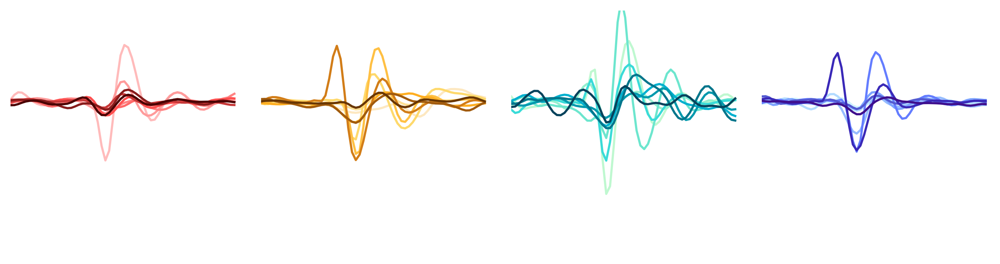

In [36]:
#figure 2A
fig = plt.figure(figsize=(12, 3), dpi=300)
gs2 = gridspec.GridSpec(1, 4, hspace=0.0, wspace=0.1)

window_start = 35
window_end = 95

#2A Spine 1
ax1 = fig.add_subplot(gs2[0, 0])
S1A1plot = S1A1sorted.get_cluster_waveforms(0) * -1
S1A2plot = S1A2sorted.get_cluster_waveforms(0) * -1
S1A3plot = S1A3sorted.get_cluster_waveforms(0) * -1
S1A4plot = S1A4sorted.get_cluster_waveforms(0) * -1
S1A5plot = S1A5sorted.get_cluster_waveforms(0) * -1
S1A6plot = S1A6sorted.get_cluster_waveforms(0) * -1
S1A7plot = S1A7sorted.get_cluster_waveforms(0) * -1
S1A8plot = S1A8sorted.get_cluster_waveforms(0) * -1

plt.plot(S1A1plot[0, window_start:window_end], color=colors['red1'])
plt.plot(S1A2plot[0, window_start:window_end], color=colors['red2'])
plt.plot(S1A3plot[0, window_start:window_end], color=colors['red3'])
plt.plot(S1A4plot[0, window_start:window_end], color=colors['red4'])
plt.plot(S1A5plot[0, window_start:window_end], color=colors['red5'])
plt.plot(S1A6plot[0, window_start:window_end], color=colors['red6'])
plt.plot(S1A7plot[0, window_start:window_end], color=colors['red7'])
plt.plot(S1A8plot[0, window_start:window_end], color=colors['red8'])

#2A Spine 2
ax2 = fig.add_subplot(gs2[0, 1])
S2A1plot = S2A1sorted.get_cluster_waveforms(0) * -1
S2A2plot = S2A2sorted.get_cluster_waveforms(0) * -1
S2A3plot = S2A3sorted.get_cluster_waveforms(2) * -1
S2A4plot = S2A4sorted.get_cluster_waveforms(0) * -1
S2A5plot = S2A5sorted.get_cluster_waveforms(0) * -1
S2A6plot = S2A6sorted.get_cluster_waveforms(0) * -1
S2A7plot = S2A7sorted.get_cluster_waveforms(0) * -1
S2A8plot = S2A8sorted.get_cluster_waveforms(1) * -1

plt.plot(S2A1plot[0, window_start:window_end], color=colors['gold1'])
plt.plot(S2A2plot[0, window_start:window_end], color=colors['gold2'])
plt.plot(S2A3plot[0, window_start:window_end], color=colors['gold3'])
plt.plot(S2A4plot[0, window_start:window_end], color=colors['gold4'])
plt.plot(S2A5plot[0, window_start:window_end], color=colors['gold5'])
plt.plot(S2A6plot[0, window_start:window_end], color=colors['gold6'])
plt.plot(S2A7plot[0, window_start:window_end], color=colors['gold7'])
plt.plot(S2A8plot[0, window_start:window_end], color=colors['gold8'])

#2A Spine 3
ax3 = fig.add_subplot(gs2[0, 2])
S3A1plot = S3A1sorted.get_cluster_waveforms(2) * -1
S3A2plot = S3A2sorted.get_cluster_waveforms(0) * -1
S3A3plot = S3A3sorted.get_cluster_waveforms(1) * -1
S3A4plot = S3A4sorted.get_cluster_waveforms(0) * -1
S3A5plot = S3A5sorted.get_cluster_waveforms(1) * -1
S3A6plot = S3A6sorted.get_cluster_waveforms(1) * -1
S3A7plot = S3A7sorted.get_cluster_waveforms(1) * -1
S3A8plot = S3A8sorted.get_cluster_waveforms(0) * -1

plt.plot(S3A1plot[0, window_start:window_end], color=colors['aqua1'])
plt.plot(S3A2plot[0, window_start:window_end], color=colors['aqua2'])
plt.plot(S3A3plot[0, window_start:window_end], color=colors['aqua3'])
plt.plot(S3A4plot[0, window_start:window_end], color=colors['aqua4'])
plt.plot(S3A5plot[0, window_start:window_end], color=colors['aqua5'])
plt.plot(S3A6plot[0, window_start:window_end], color=colors['aqua6'])
plt.plot(S3A7plot[0, window_start:window_end], color=colors['aqua7'])
plt.plot(S3A8plot[0, window_start:window_end], color=colors['aqua8'])

#2A Spine 4
ax4 = fig.add_subplot(gs2[0, 3])
S4A1plot = S4A1sorted.get_cluster_waveforms(0) * -1
S4A2plot = S4A2sorted.get_cluster_waveforms(0) * -1
S4A3plot = S4A3sorted.get_cluster_waveforms(0) * -1
S4A4plot = S4A4sorted.get_cluster_waveforms(0) * -1
S4A5plot = S4A5sorted.get_cluster_waveforms(0) * -1
S4A6plot = S4A6sorted.get_cluster_waveforms(0) * -1
S4A7plot = S4A7sorted.get_cluster_waveforms(2) * -1
S4A8plot = S4A8sorted.get_cluster_waveforms(0) * -1

plt.plot(S4A1plot[0, window_start:window_end], color=colors['blue1'])
plt.plot(S4A2plot[0, window_start:window_end], color=colors['blue2'])
plt.plot(S4A3plot[0, window_start:window_end], color=colors['blue3'])
plt.plot(S4A4plot[0, window_start:window_end], color=colors['blue4'])
plt.plot(S4A5plot[0, window_start:window_end], color=colors['blue5'])
plt.plot(S4A6plot[0, window_start:window_end], color=colors['blue6'])
plt.plot(S4A7plot[0, window_start:window_end], color=colors['blue7'])
plt.plot(S4A8plot[0, window_start:window_end], color=colors['blue8'])

#set ticks
ax1.set_xbound([0,60])
ax1.set_xticks([0, 8])
ax2.set_xbound([0,60])
ax2.set_xticks([0, 8])
ax3.set_xbound([0,60])
ax3.set_xticks([0, 8])
ax4.set_xbound([0,60])
ax4.set_xticks([0, 8])

ax1.set_ybound([-0.1, 0.06])
ax2.set_ybound([-0.1, 0.06])
ax3.set_ybound([-0.1, 0.06])
ax4.set_ybound([-0.1, 0.06])
ax1.set_yticks([0, 0.02])
ax2.set_yticks([0, 0.02])
ax3.set_yticks([0, 0.02])
ax4.set_yticks([0, 0.02])

#clean
ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')

plt.tight_layout()
plt.show()


# Firing Rate Analysis

In [37]:
#firing rate analysis
spikes_dict = {}
firing_rate_dict = {}

for S in range(1, 5):
    for A in range(1, 9):

        variable_name = f'S{S}A{A}plot'
        array = globals()[variable_name]
        spikes_variable_name = f'S{S}A{A}spikes'
        spikes_dict[spikes_variable_name] = array.shape[0]

for key, spike_count in spikes_dict.items():

    firing_rate = spike_count / 2
    firing_rate_variable_name = key.replace('spikes', 'FR')
    firing_rate_dict[firing_rate_variable_name] = firing_rate


## Spine 1 Sort By Freq

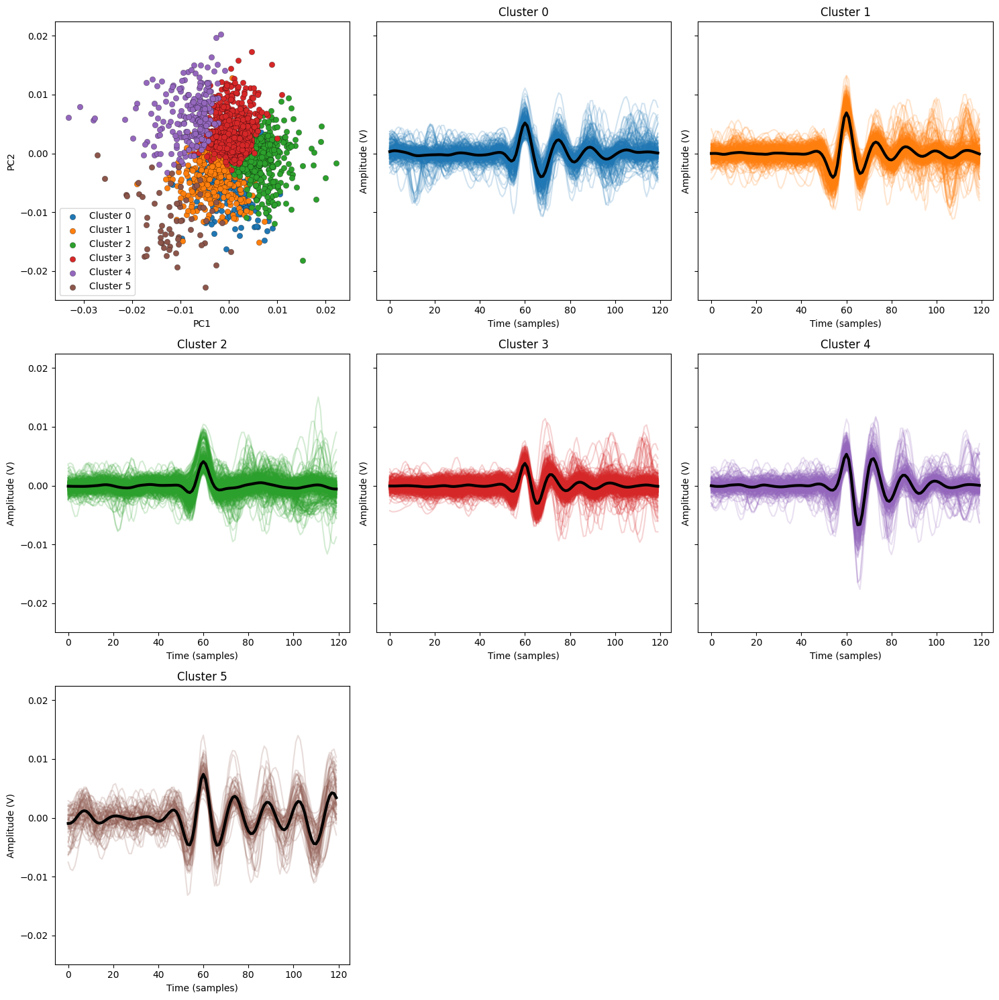

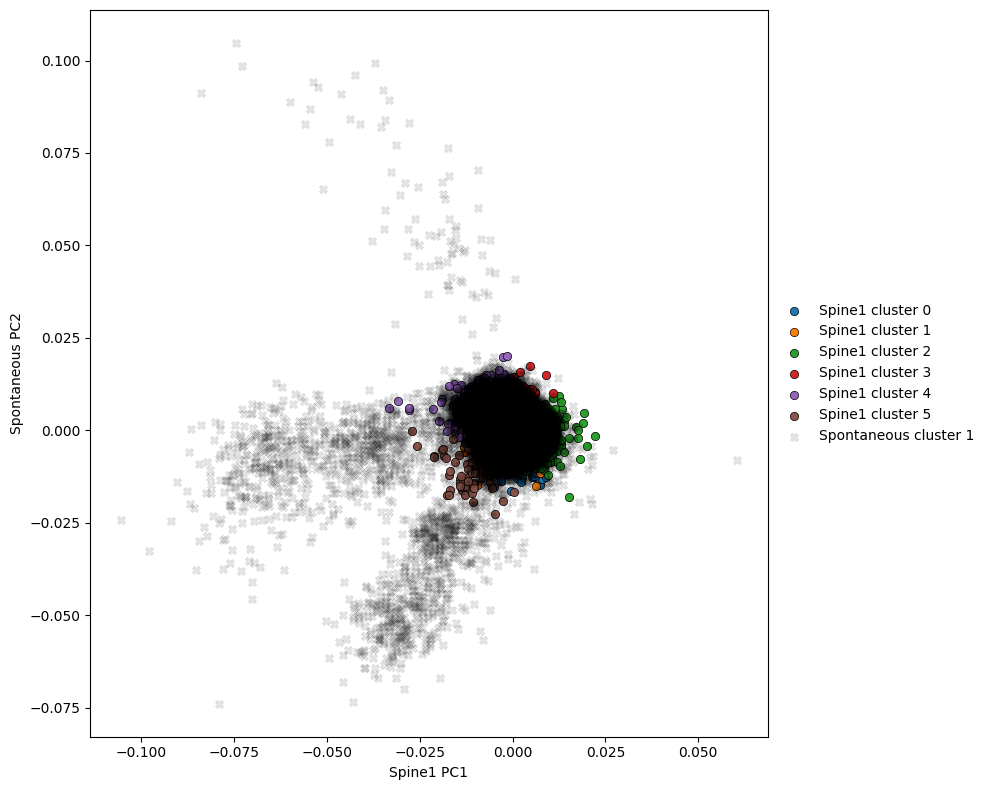

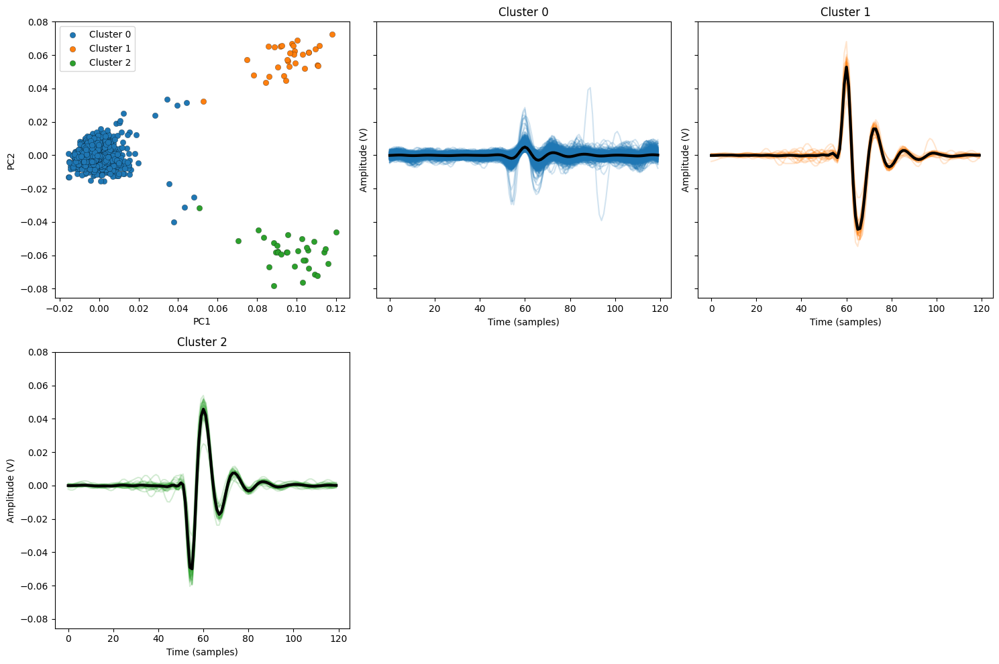

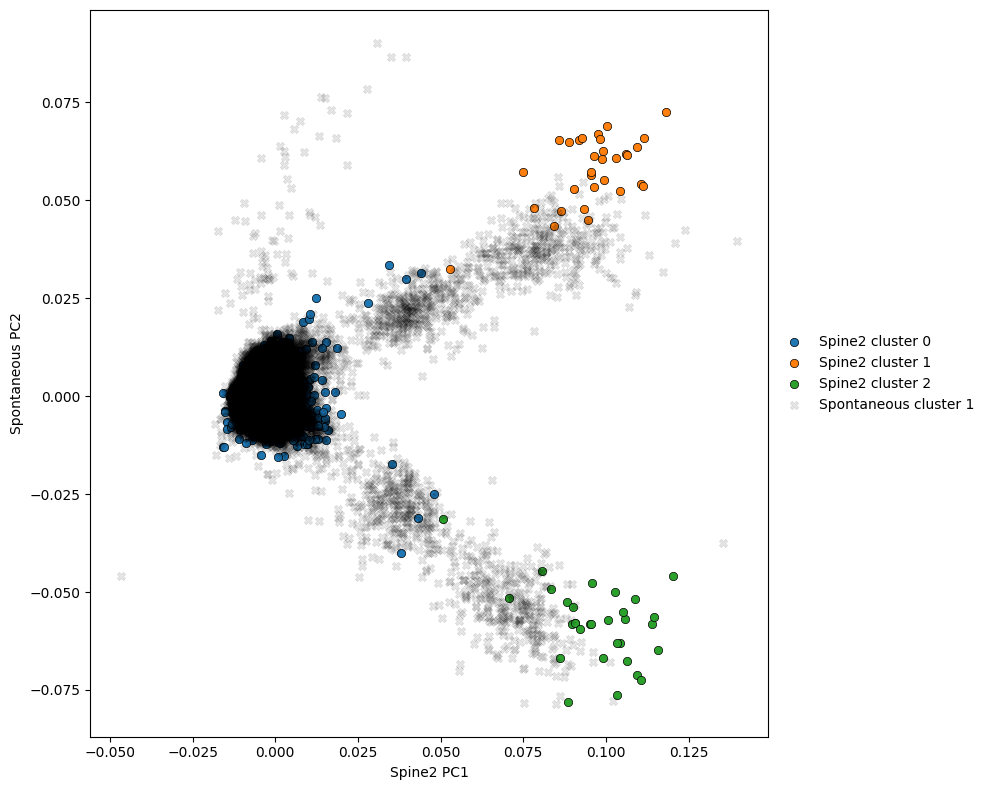

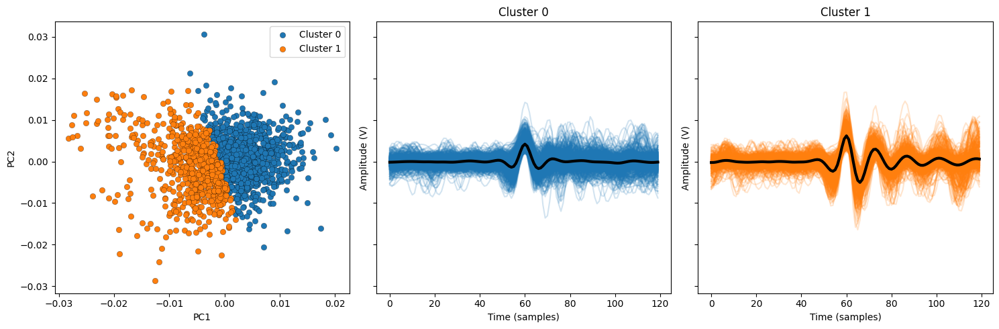

...

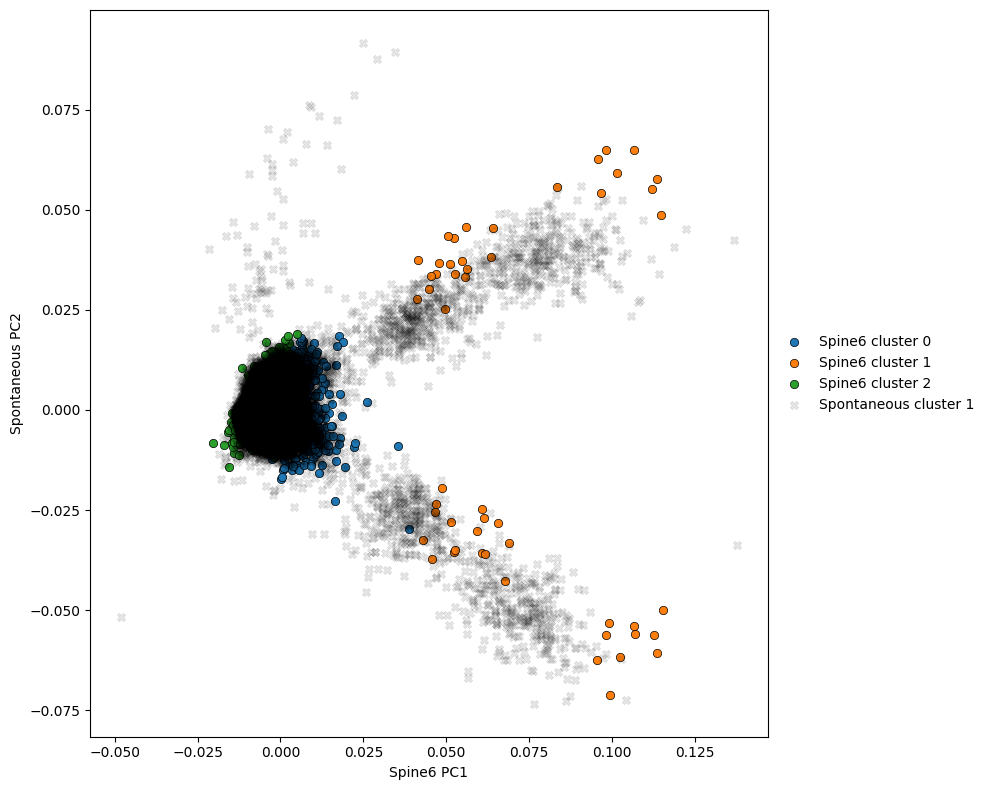

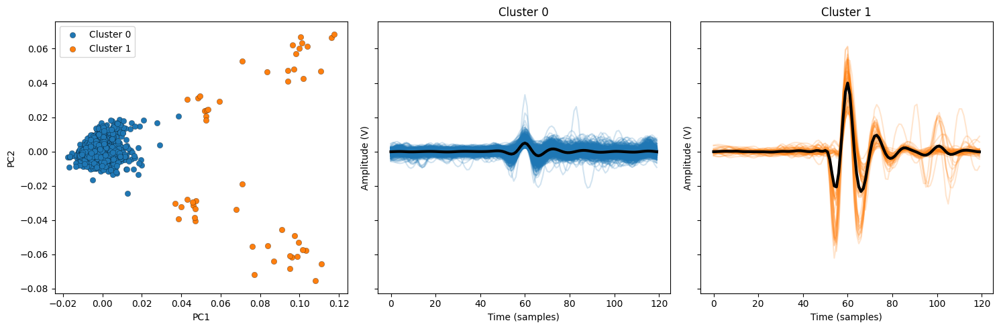

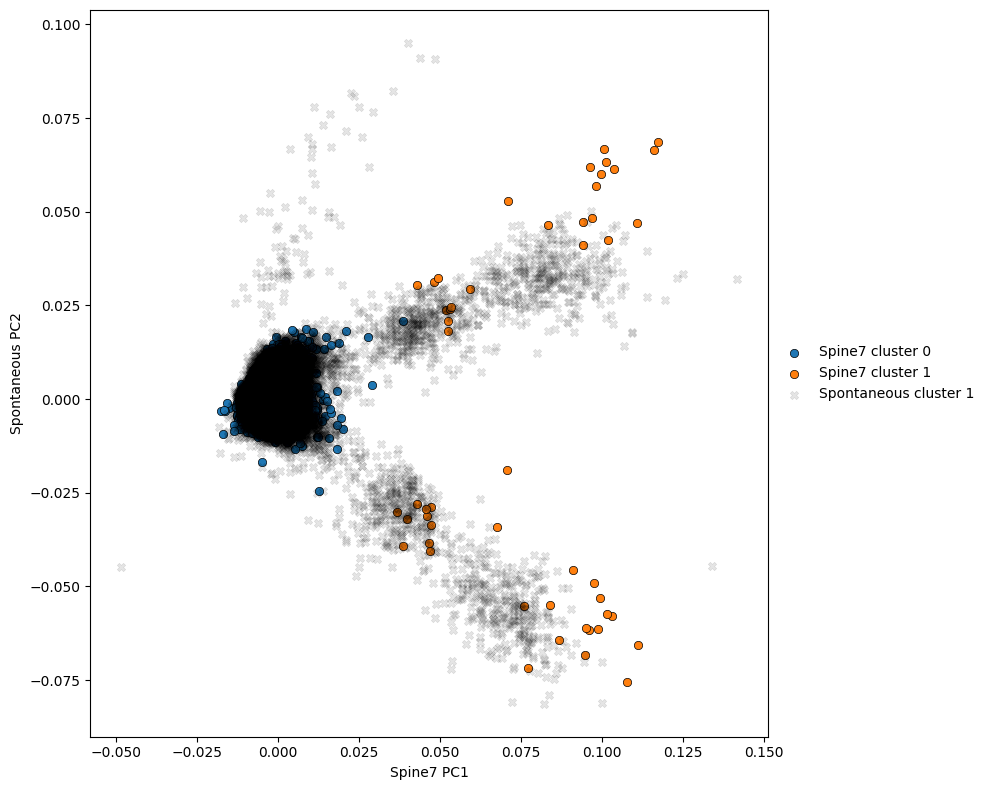

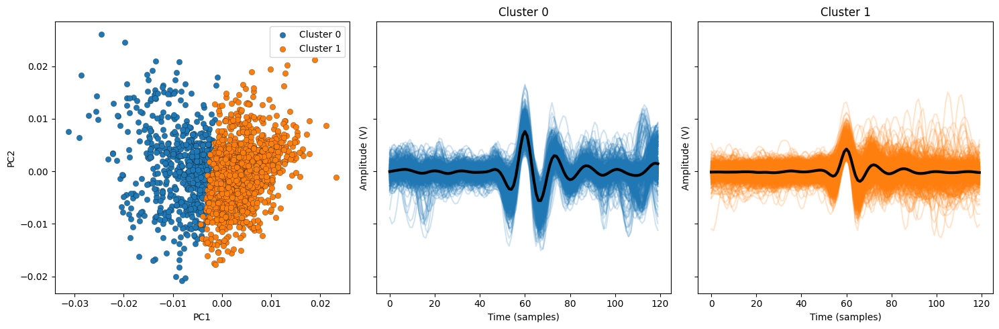

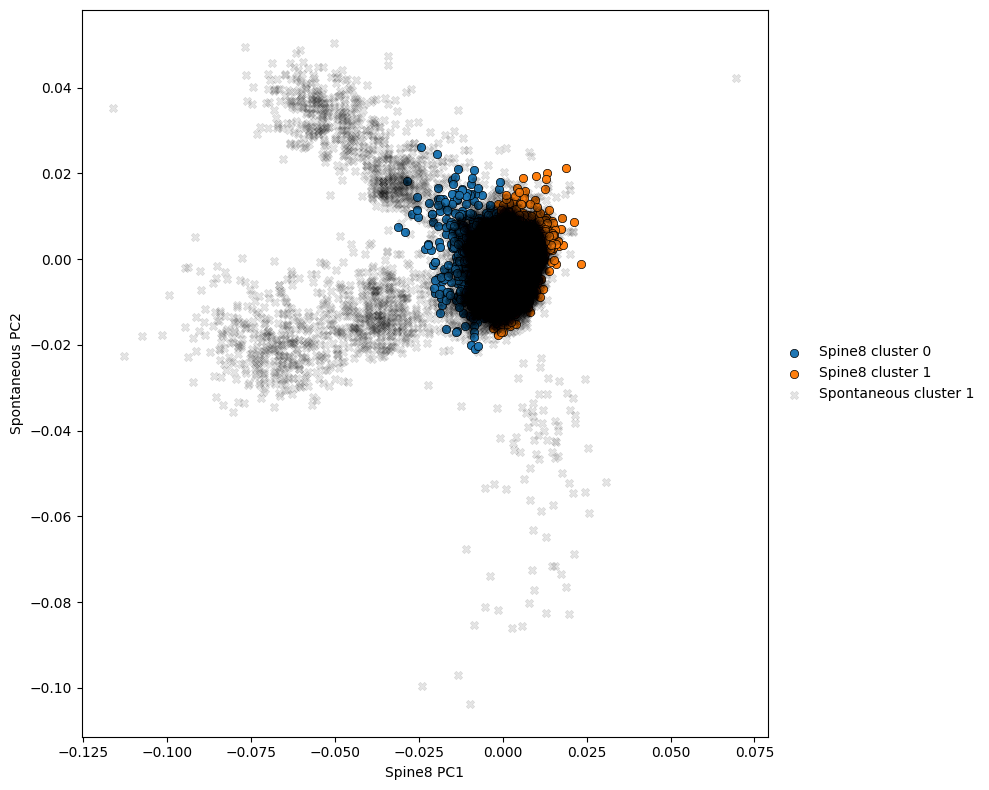

<Figure size 640x480 with 0 Axes>

In [38]:
#frequency specific sorting for spine 1
freqArrays = splitByStim(freqConcat)

spine1freq1 = freqArrays[0]
spine1freq2 = freqArrays[1]
spine1freq3 = freqArrays[2]
spine1freq4 = freqArrays[3]
spine1freq5 = freqArrays[4]
spine1freq6 = freqArrays[5]
spine1freq7 = freqArrays[6]
spine1freq8 = freqArrays[7]


# Loop through each frquency array and plot clusters, PCA, and compared to spontaneous
for i, spine_freq in enumerate(freqArrays):
    sortedSpine = ntk.sort_spikes(spine_freq[0], fs=dataset.fs, threshold_multiplier=2, waveform_window = 40 * 3, cluster_dimensions=10)
    #sortedSpine.hand_pick_clusters()

    globals()[f'S1F{i+1}sorted'] = sortedSpine

    sortedSpine.plot_clusters()
    group_1_transformed, group_2_transformed = compare_clusters(sortedSpine, sortedSpontaneous, f'Spine{i+1}', 'Spontaneous')

plt.tight_layout()
plt.show()

# Figure 2B-D

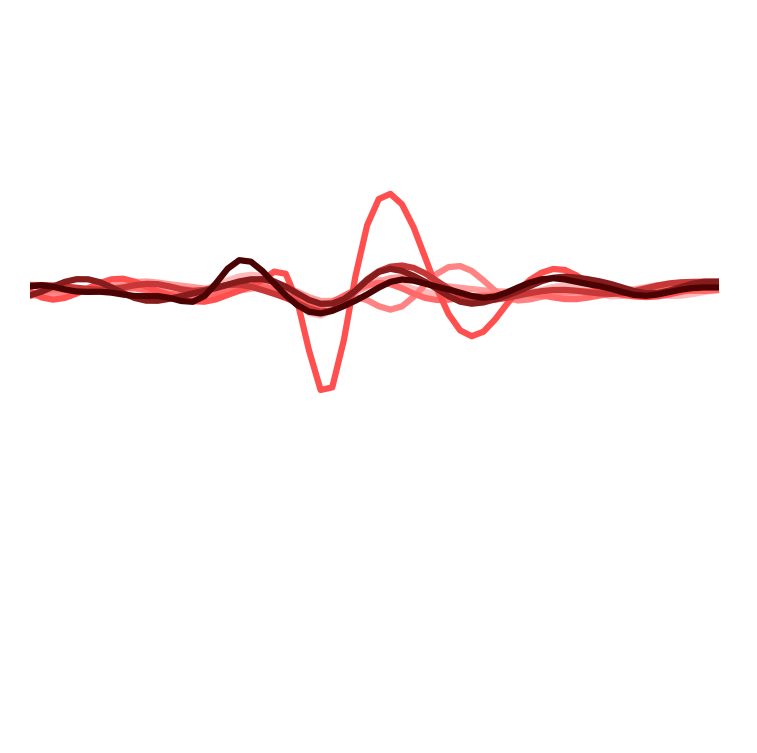

In [39]:
#figure 2C
fig, ax1 = plt.subplots(figsize=(3, 3), dpi=300)

window_start = 35
window_end = 95

# Variable definitions for waveforms
S1F1plot = S1F1sorted.get_cluster_waveforms(1) * -1
S1F2plot = S1F2sorted.get_cluster_waveforms(0) * -1
S1F3plot = S1F3sorted.get_cluster_waveforms(0) * -1
S1F4plot = S1F4sorted.get_cluster_waveforms(0) * -1
S1F5plot = S1F5sorted.get_cluster_waveforms(0) * -1
S1F6plot = S1F6sorted.get_cluster_waveforms(0) * -1
S1F7plot = S1F7sorted.get_cluster_waveforms(0) * -1
S1F8plot = S1F8sorted.get_cluster_waveforms(0) * -1

# Plotting waveforms
ax1.plot(S1F1plot[0, window_start:window_end], color=colors['red1'])
ax1.plot(S1F2plot[0, window_start:window_end], color=colors['red2'])
ax1.plot(S1F3plot[0, window_start:window_end], color=colors['red3'])
ax1.plot(S1F4plot[0, window_start:window_end], color=colors['red4'])
ax1.plot(S1F5plot[0, window_start:window_end], color=colors['red5'])
ax1.plot(S1F6plot[0, window_start:window_end], color=colors['red6'])
ax1.plot(S1F7plot[0, window_start:window_end], color=colors['red7'])
ax1.plot(S1F8plot[0, window_start:window_end], color=colors['red8'])

# Set x-axis bounds and ticks
ax1.set_xlim([0, 60])
ax1.set_xticks([0, 8])

# Set y-axis bounds and ticks
ax1.set_ylim([-0.1, 0.06])
ax1.set_yticks([0, 0.02])

# Remove the axis (clean look)
ax1.axis('off')

# Show the plot
plt.show()


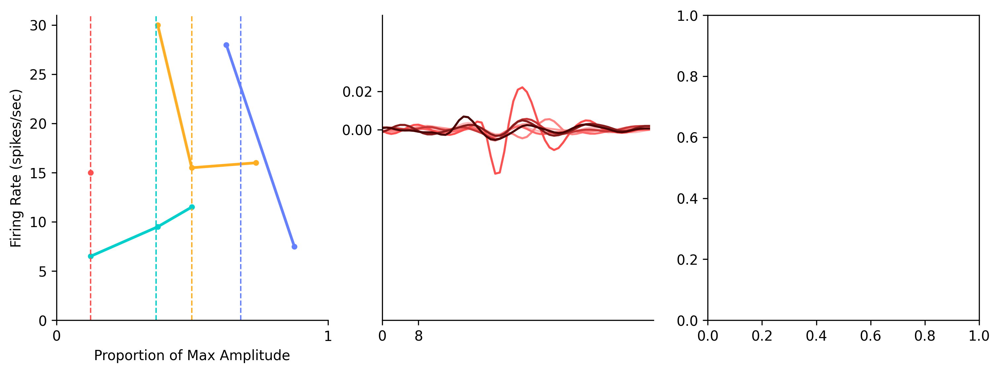

In [40]:
# Figure 2 B-D
fig = plt.figure(figsize=(12, 4), dpi=300)
gs22 = gridspec.GridSpec(1, 3, hspace=0.0, wspace=0.2)

# Figure 2B (scatter plot)
ax1 = fig.add_subplot(gs22[0, 0])
amplitude_values = [29.5, 59.6, 87.7, 117.1, 147.1, 172.8, 206.0, 235.1]
max_amplitude = 235.1

weighted_averages = {}

# Calculate proportions of max amplitude
proportions = [amp / max_amplitude for amp in amplitude_values]

# Prepare data for scatter plot
firing_rates = []  # List to hold firing rates
spine_numbers = []  # List to hold spine numbers
amplitude_indices = []  # List to hold amplitude indices

# Loop through all combinations of S (1-4) and A (1-8)
for S in range(1, 5):
    for A in range(1, 9):
        # Construct the firing rate variable name
        firing_rate_variable_name = f'S{S}A{A}FR'
        
        # Check if firing rate exists in the dictionary
        if firing_rate_variable_name in firing_rate_dict:
            firing_rates.append(firing_rate_dict[firing_rate_variable_name])
            spine_numbers.append(S)  # Spine number is the number after S
            amplitude_indices.append(A - 1)  # Store the amplitude index (0-based)

# Define custom colors for each spine number using the existing colors dictionary
FRcolors = {1: colors['red'], 2: colors['gold'], 3: colors['aqua'], 4: colors['blue']}

# Loop through the unique spine numbers and plot each with the corresponding color
for spine in FRcolors.keys():
    # Get the indices of the points corresponding to the current spine number
    indices = [i for i, s in enumerate(spine_numbers) if s == spine]
    
    # Filter out points based on a condition (e.g., firing rate < 1)
    filtered_indices = [i for i in indices if firing_rates[i] <= 60]  # Example condition

    # Check if there are any filtered points to plot
    if filtered_indices:
        ax1.scatter(
            [proportions[amplitude_indices[i]] for i in filtered_indices],  # Use amplitude index
            [firing_rates[i] for i in filtered_indices],
            color=FRcolors[spine],
            label=f'Spine {spine}',
            s=10,
            alpha=1
        )

        sorted_filtered_indices = sorted(filtered_indices, key=lambda i: proportions[amplitude_indices[i]])

        ax1.plot(
            [proportions[amplitude_indices[i]] for i in sorted_filtered_indices],
            [firing_rates[i] for i in sorted_filtered_indices],
            color=FRcolors[spine],
            linewidth=2,
            alpha=1)

        # Calculate weighted average for the x-values (proportions) with the filtered points
        weights = [firing_rates[i] for i in filtered_indices]  # Use filtered firing rates as weights
        weighted_x_sum = sum(proportions[amplitude_indices[i]] * firing_rates[i] for i in filtered_indices)
        total_weight = sum(weights)
        weighted_average_x = weighted_x_sum / total_weight if total_weight != 0 else 0  # Avoid division by zero

        # Draw a vertical line at the weighted average x-value
        ax1.axvline(x=weighted_average_x, color=FRcolors[spine], linestyle='--', linewidth=1, label=f'Weighted Avg Spine {spine}')

# Label axes and title for ax1
ax1.set_xlabel('Proportion of Max Amplitude')
ax1.set_ylabel('Firing Rate (spikes/sec)')

# Adjust the appearance of ax1
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_visible(True)
ax1.set_xticks([0, 1])
ax1.set_ybound(0, 31)

# Plot waveforms in ax2
ax2 = fig.add_subplot(gs22[0, 1])

window_start = 35
window_end = 95

# Variable definitions for waveforms
S1F1plot = S1F1sorted.get_cluster_waveforms(1) * -1
S1F2plot = S1F2sorted.get_cluster_waveforms(0) * -1
S1F3plot = S1F3sorted.get_cluster_waveforms(0) * -1
S1F4plot = S1F4sorted.get_cluster_waveforms(0) * -1
S1F5plot = S1F5sorted.get_cluster_waveforms(0) * -1
S1F6plot = S1F6sorted.get_cluster_waveforms(0) * -1
S1F7plot = S1F7sorted.get_cluster_waveforms(0) * -1
S1F8plot = S1F8sorted.get_cluster_waveforms(0) * -1

# Plotting waveforms in ax2
ax2.plot(S1F1plot[0, window_start:window_end], color=colors['red1'])
ax2.plot(S1F2plot[0, window_start:window_end], color=colors['red2'])
ax2.plot(S1F3plot[0, window_start:window_end], color=colors['red3'])
ax2.plot(S1F4plot[0, window_start:window_end], color=colors['red4'])
ax2.plot(S1F5plot[0, window_start:window_end], color=colors['red5'])
ax2.plot(S1F6plot[0, window_start:window_end], color=colors['red6'])
ax2.plot(S1F7plot[0, window_start:window_end], color=colors['red7'])
ax2.plot(S1F8plot[0, window_start:window_end], color=colors['red8'])

# Set axis limits and clean up ax2
ax2.set_xlim([0, 60])
ax2.set_xticks([0, 8])

ax2.set_ylim([-0.1, 0.06])
ax2.set_yticks([0, 0.02])

# Hide axis borders
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax3 = fig.add_subplot(gs22[0, 2])

# Show the figure
plt.show()